In [56]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
import xgboost as xgb
from xgboost import XGBRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from lightgbm import LGBMRegressor
import lightgbm as lgb
from sklearn.ensemble import AdaBoostRegressor
from sklearn.datasets import make_regression
from sklearn.tree import DecisionTreeRegressor



In [57]:
data = pd.read_csv('train_data.csv')


In [58]:
#cell for hot encoding 'condition column'...
encoded_condition = pd.get_dummies(data['condition'], prefix='condition')
data = pd.concat([data, encoded_condition], axis=1)


In [59]:
#x-axis and y-axis created in this cell...
columns_to_drop = ['datasetId', 'uuid', 'condition']
data.drop(columns=columns_to_drop, inplace=True, errors='ignore')

#X = data
X = data.drop(columns='HR', axis=1) 
y = data[['HR']]

print("Shape of features (X):", X.shape)
print("Shape of Heart Rate (y):", y.shape)
print(data.head(2))


Shape of features (X): (5000, 36)
Shape of Heart Rate (y): (5000, 1)
           VLF    VLF_PCT           LF     LF_PCT      LF_NU         HF  \
0  2259.833995  67.884986  1058.573968  31.799362  99.017120  10.507787   
1  2430.367576  60.980572  1541.466293  38.677070  99.122594  13.644635   

     HF_PCT     HF_NU           TP       LF_HF  ...  MEDIAN_REL_RR  \
0  0.315652  0.982880  3328.915749  100.741860  ...      -0.000191   
1  0.342359  0.877406  3985.478504  112.972337  ...      -0.000671   

   SDRR_REL_RR  RMSSD_REL_RR  SDSD_REL_RR  SDRR_RMSSD_REL_RR  KURT_REL_RR  \
0     0.017395      0.007729     0.007729           2.250533    -0.812408   
1     0.021513      0.011262     0.011262           1.910181     0.014594   

   SKEW_REL_RR  condition_interruption  condition_no stress  \
0    -0.156490                    True                False   
1    -0.595771                    True                False   

   condition_time pressure  
0                    False  
1             

In [60]:
#z-score normalize...
scaler = StandardScaler()
normalized_data = scaler.fit_transform(data)
#new data for further use...
normalized_df = pd.DataFrame(normalized_data, columns=data.columns)

print(normalized_df.head(2))

        VLF   VLF_PCT        LF    LF_PCT     LF_NU        HF    HF_PCT  \
0  0.009164  0.193785  0.198913 -0.121419  0.834269 -0.624524 -0.730045   
1  0.101163 -0.215817  1.042175  0.305254  0.859383 -0.557616 -0.715153   

      HF_NU        TP     LF_HF  ...  MEDIAN_REL_RR  SDRR_REL_RR  \
0 -0.834269  0.051903 -0.033914  ...       0.292115    -0.227342   
1 -0.859383  0.387262  0.003065  ...      -0.254054     0.525845   

   RMSSD_REL_RR  SDSD_REL_RR  SDRR_RMSSD_REL_RR  KURT_REL_RR  SKEW_REL_RR  \
0     -0.513223    -0.513219           0.648794    -0.792147    -0.320923   
1      0.380635     0.380639          -0.250909    -0.316426    -0.942320   

   condition_interruption  condition_no stress  condition_time pressure  
0                1.613971            -1.087407                -0.469791  
1                1.613971            -1.087407                -0.469791  

[2 rows x 37 columns]


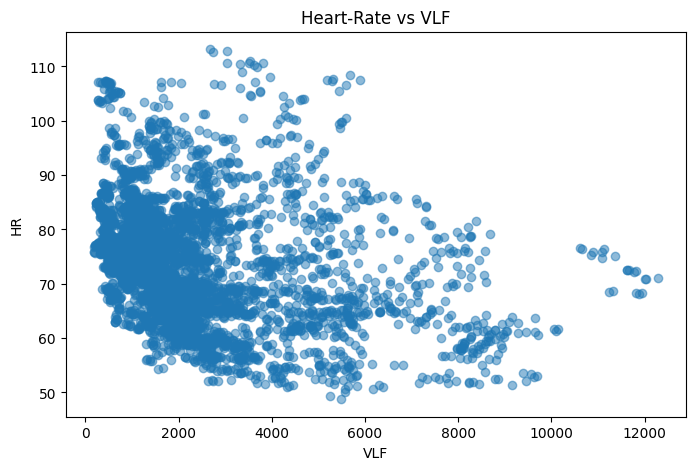

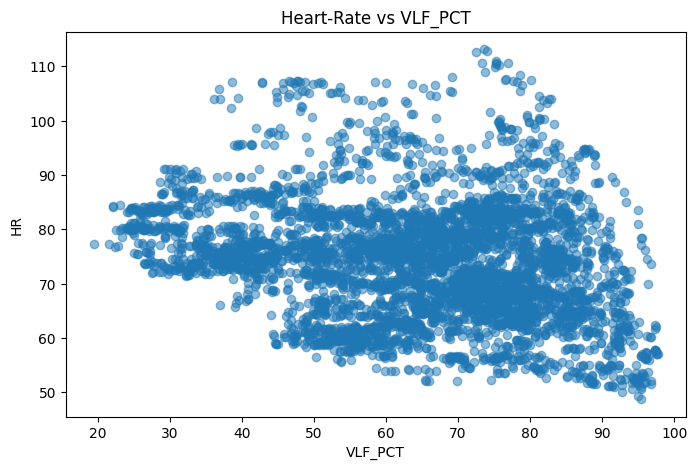

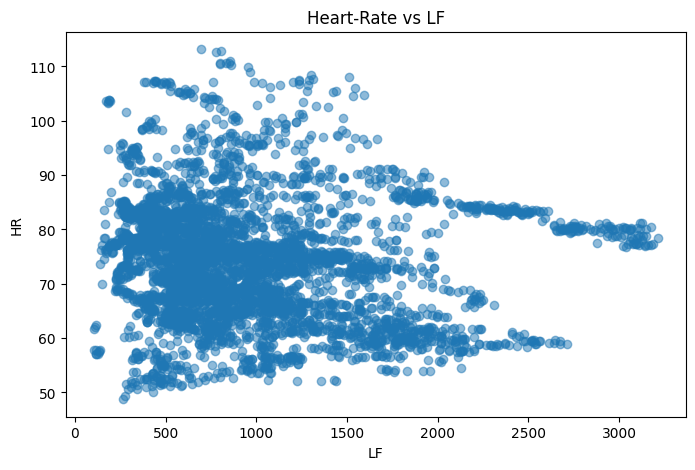

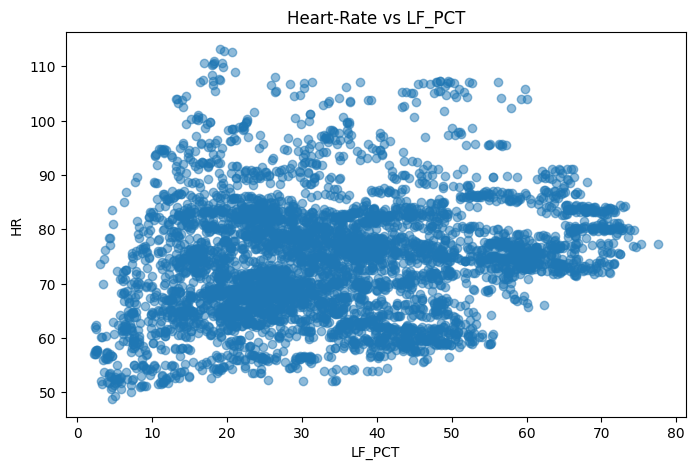

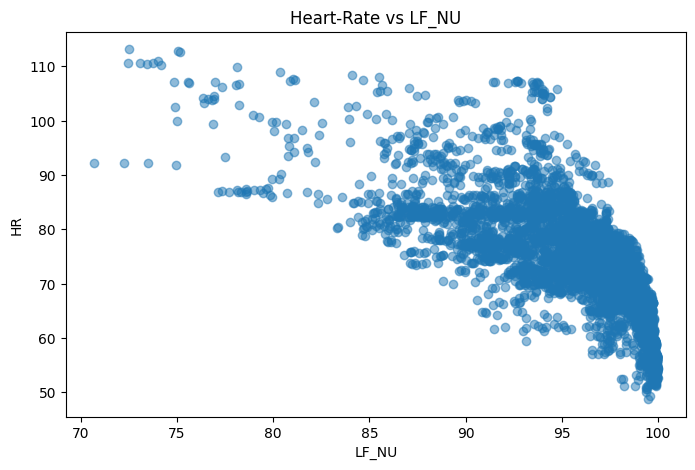

...

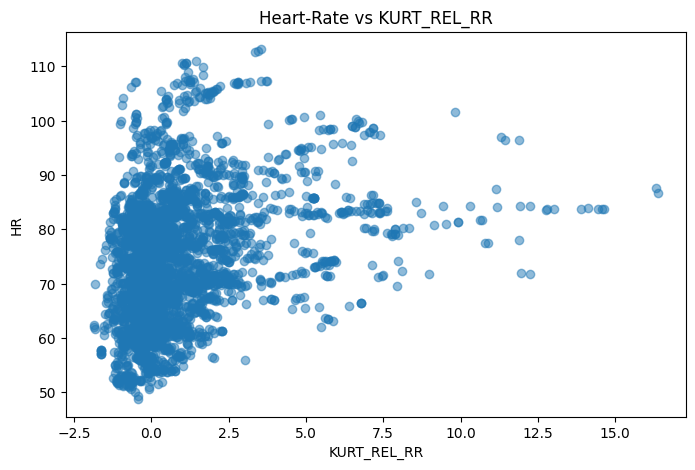

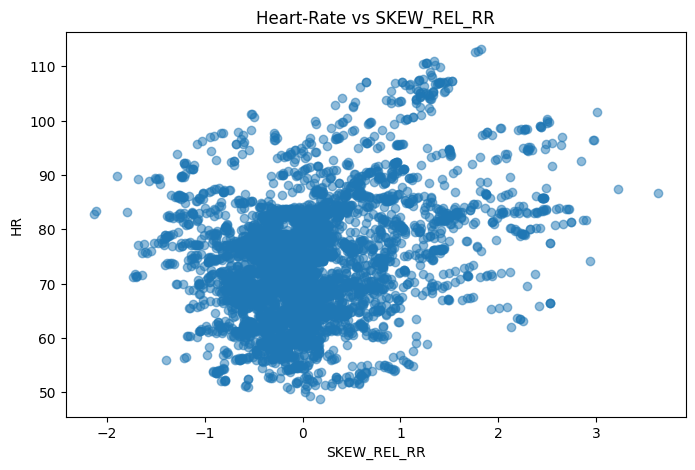

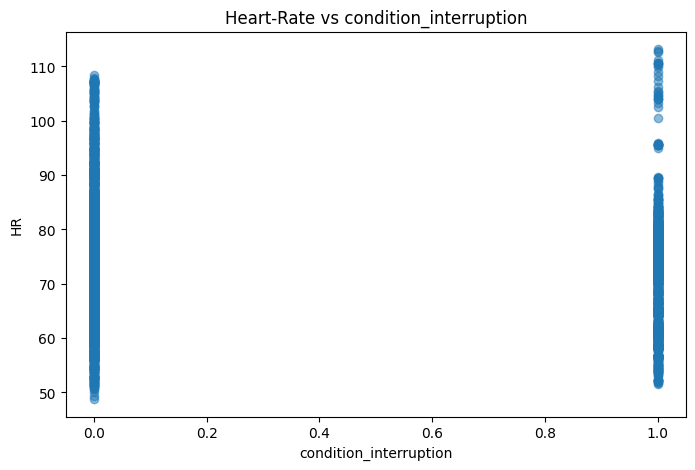

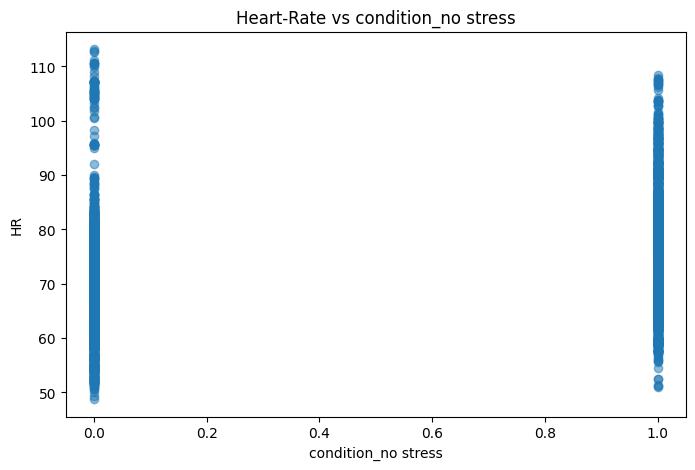

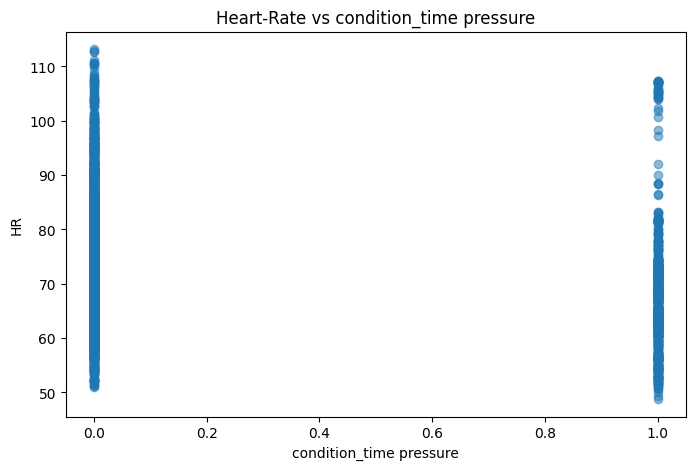

In [62]:
# Plotting 'HR' against each feature to knnow relation...
for feature in X.columns:
    plt.figure(figsize=(8, 5))
    plt.scatter(X[feature], y, alpha=0.5)
    plt.title(f'Heart-Rate vs {feature}')
    plt.xlabel(feature)
    plt.ylabel('HR')
    plt.show()


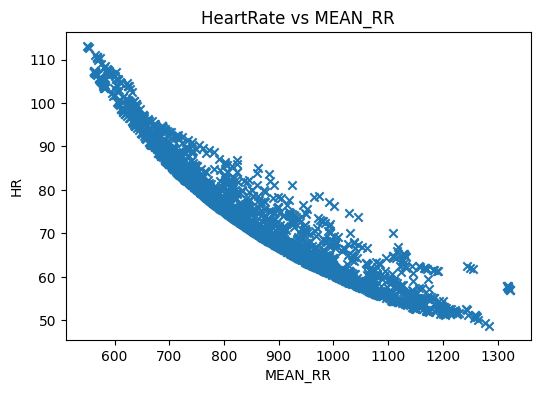

In [8]:
for feature in X.columns:
    plt.figure(figsize=(6, 4))
    plt.scatter(X[feature], y, marker='x')
    plt.title(f'HeartRate vs {feature}')
    plt.xlabel(feature)
    plt.ylabel('HR')
    plt.show()


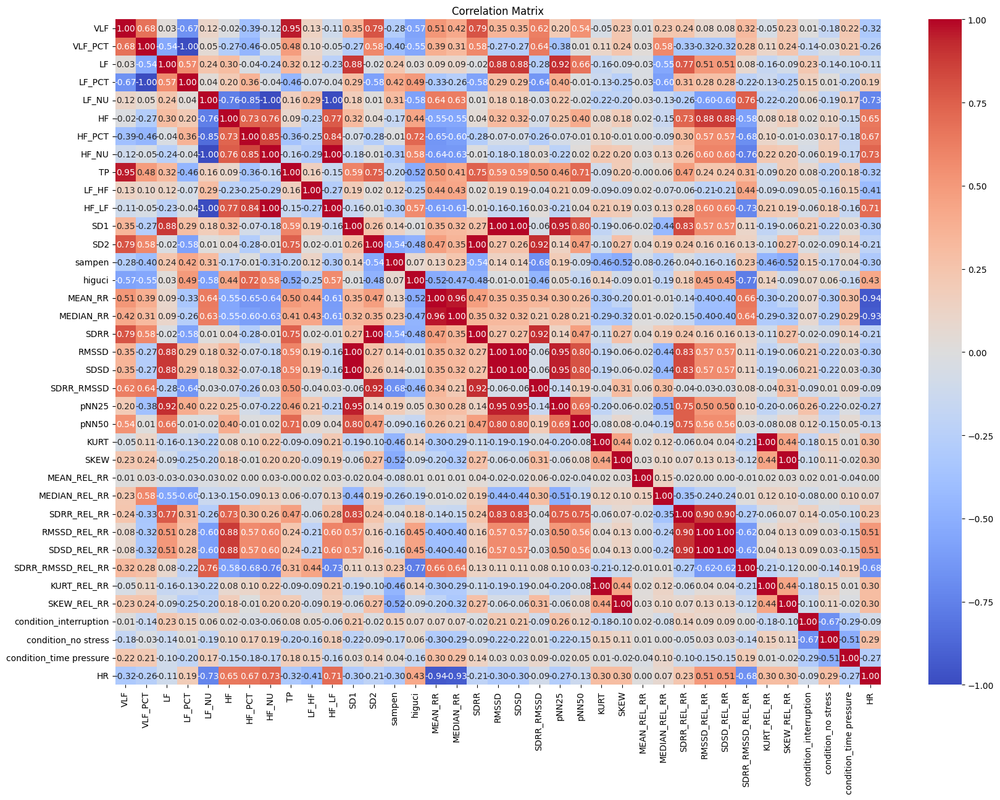

In [63]:
# Create a correlation matrix
correlation_matrix = pd.concat([X, y], axis=1).corr()

# Plot a heatmap of the correlation matrix
plt.figure(figsize=(20, 14))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()


In [51]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.1, random_state=42)

ValueError: Found input variables with inconsistent numbers of samples: [10, 5000]

In [10]:
model = LinearRegression()

# Training the model on the training data
model.fit(X_train, y_train)

# Making predictions on the test set
predictions = model.predict(X_valid)

# Evaluating the model
mse = mean_squared_error(y_valid, predictions)
r2 = r2_score(y_valid, predictions)

print(f"Mean Squared Error (MSE): {mse}")
print(f"R-squared (R2): {r2}")

Mean Squared Error (MSE): 10.173421692027809
R-squared (R2): 0.9027411873262654


In [11]:
X_Paul=((60/X)*1010) + 0.8890873577418148
print(X_Paul)

        MEAN_RR
0     73.120024
1     63.704457
2     83.996608
3     80.919849
4     76.776668
...         ...
4995  85.412070
4996  81.392305
4997  46.884248
4998  67.941033
4999  84.319599

[5000 rows x 1 columns]


In [12]:
data1 = pd.read_csv('sample_output_generated.csv')

In [13]:
y = data1
y = y['HR']

In [14]:
print(y)

0    75.206050
1    80.870132
2    62.313063
3    66.336924
4    64.422596
5    56.061095
6    75.543673
7    62.458281
8    56.271876
9    71.201501
Name: HR, dtype: float64


In [15]:
r2 = r2_score(y, X_Paul)
print(r2)

ValueError: Found input variables with inconsistent numbers of samples: [10, 5000]

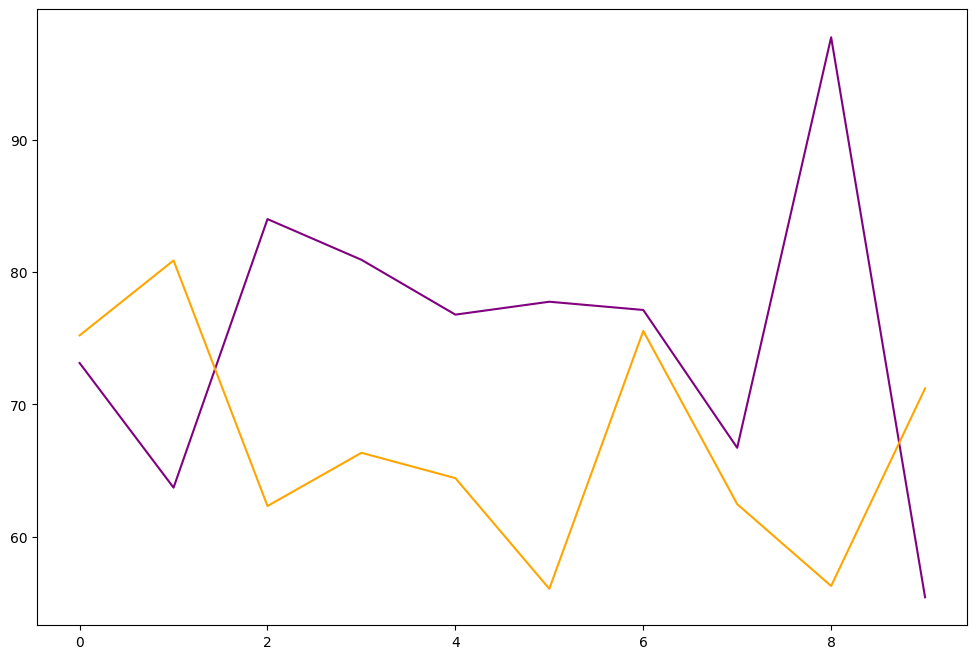

In [16]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,10), X_Paul[:10], color = 'purple')
plt.plot(range(0,10), y[:10], color = 'orange')
plt.show()


In [17]:
X_sanju = X_Paul.mean()
print(X_sanju)

MEAN_RR    74.002691
dtype: float64


In [18]:
y_sanju = y.mean()
print(y_sanju)

67.06851891873706


In [19]:
y_sanju - X_sanju

MEAN_RR   -6.934172
dtype: float64

In [20]:
#Random Forest predictions...

def train_random_forest_model(X, y):
    model = RandomForestRegressor(n_estimators=112, random_state=42)
    model.fit(X, y)
    return model


trained_rf_model = train_random_forest_model(X_train, y_train)

# predictions...
predicted_hr_rf = trained_rf_model.predict(X_valid)
print("Predicted Heart Rate (Random Forest):\n", predicted_hr_rf[:20])

/home/sanju/.local/lib/python3.10/site-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Predicted Heart Rate (Random Forest):
 [60.47365811 58.75427378 82.76371892 81.35974434 63.99759394 83.58115979
 75.93405226 93.81931772 64.56417408 82.99774796 55.23081725 80.8225413
 72.71093489 77.05540166 68.89712217 86.46443033 80.26454127 69.61522615
 66.81580837 80.05048501]


In [22]:
print(y_valid[:20])

             HR
1501  61.235682
2586  58.203635
2653  82.448077
1055  80.394175
705   65.383191
106   83.396229
589   82.345164
2468  88.424025
2413  64.508250
1600  82.676852
2464  64.589626
228   81.455595
915   72.674690
794   84.796915
3021  68.202619
3543  86.814325
1073  77.462084
3351  69.337903
1744  69.487255
1084  80.099415


In [23]:
r2_score_rf = r2_score(y_valid, predicted_hr_rf)
print(r2_score_rf)

0.94168044160387


In [24]:
#parameter testing with grid search...

#param_grid = {
   # 'n_estimators': [25, 50,75, 80, 90, 95, 100, 110, 125,150, 200, 250]  # Add more values if needed
#}

param_grid = {
    'n_estimators': [100, 102, 104, 106, 108, 110, 112, 115, 117, 119]  # Add more values if needed
}

# RF MODEL...
rf = RandomForestRegressor(random_state=42)

#GridSearchCV for RF...
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, scoring='r2')

grid_search.fit(X_train, y_train)

# best n_estimator...
best_n_estimators = grid_search.best_params_['n_estimators']
print("Best n_estimators value:", best_n_estimators)

/home/sanju/.local/lib/python3.10/site-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/home/sanju/.local/lib/python3.10/site-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/home/sanju/.local/lib/python3.10/site-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/home/sanju/.local/lib/python3.10/site-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y 

Best n_estimators value: 112


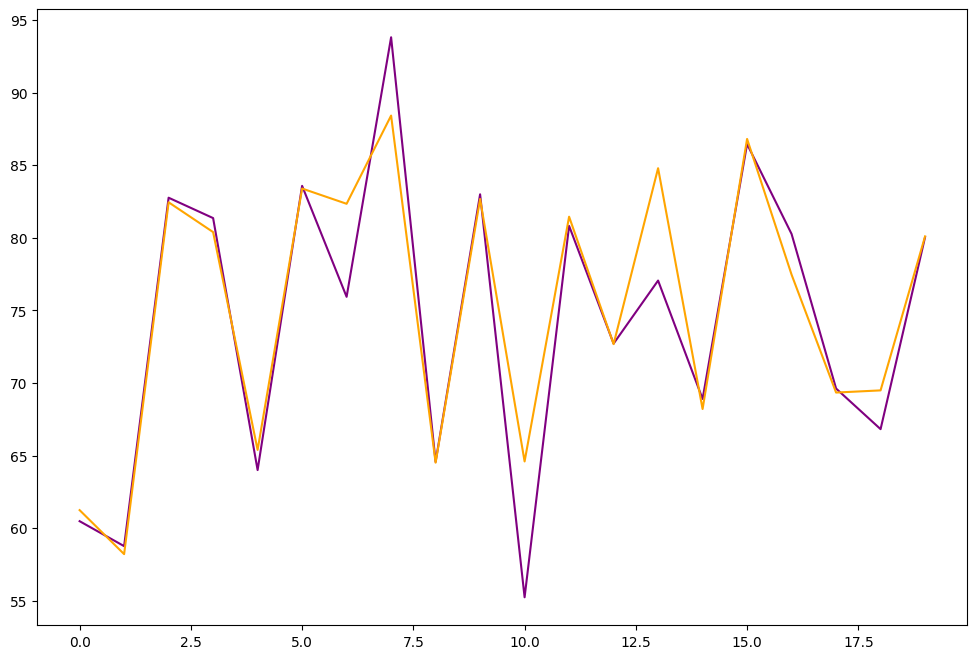

In [25]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), predicted_hr_rf[:20], color = 'purple')
plt.plot(range(0,20), y_valid[:20], color = 'orange')
plt.show()


In [26]:
#use grid search to find best value for XGBOOST...

dtrain = xgb.DMatrix(X_train, label=y_train)

# parameters for xgboost...
params = {
    'objective': 'reg:squarederror', 
    'eval_metric': 'rmse'            
}

# num_round range...
param_grid = {
    'n_estimators': [5,10 , 12,14, 15,16, 17, 25, 50, 75, 100, 125, 150, 175, 200]
}

# XGBoost...
xg_reg = xgb.XGBRegressor(**params)

# GridSearchCV...
grid_search = GridSearchCV(estimator=xg_reg, param_grid=param_grid, cv=5, scoring='r2')

grid_search.fit(X_train, y_train)

# Best value...
best_num_round = grid_search.best_params_['n_estimators']
print("Best num_round value:", best_num_round)



Best num_round value: 15


In [27]:
#XGboost final model...
best_model = grid_search.best_estimator_

# Prediction...
pred_XGB = best_model.predict(X_valid)

# Calculate R-squared score for the best model
r2 = r2_score(y_valid, pred_XGB)
print("R-squared (R2) Score using best model:", r2)

R-squared (R2) Score using best model: 0.9643519190817088


In [28]:
print(pred_XGB[330:350])

[73.2258   68.71338  73.004    57.825264 79.377    63.101933 79.377
 86.76453  64.57532  62.356102 68.73759  62.356102 76.35306  72.33896
 59.105274 78.28384  83.72435  78.96234  72.521774 86.76453 ]


In [29]:
print(y_valid[330:350])

             HR
3941  72.871370
414   67.770572
4148  71.591756
1183  56.585294
485   78.578071
893   61.982028
805   78.785436
555   86.041398
3825  64.847796
1197  61.287384
4253  67.892783
4058  61.324346
1293  76.377663
2221  71.752759
3504  55.917584
3654  78.076567
4758  83.834593
3006  78.686381
2093  71.497724
2187  86.117047


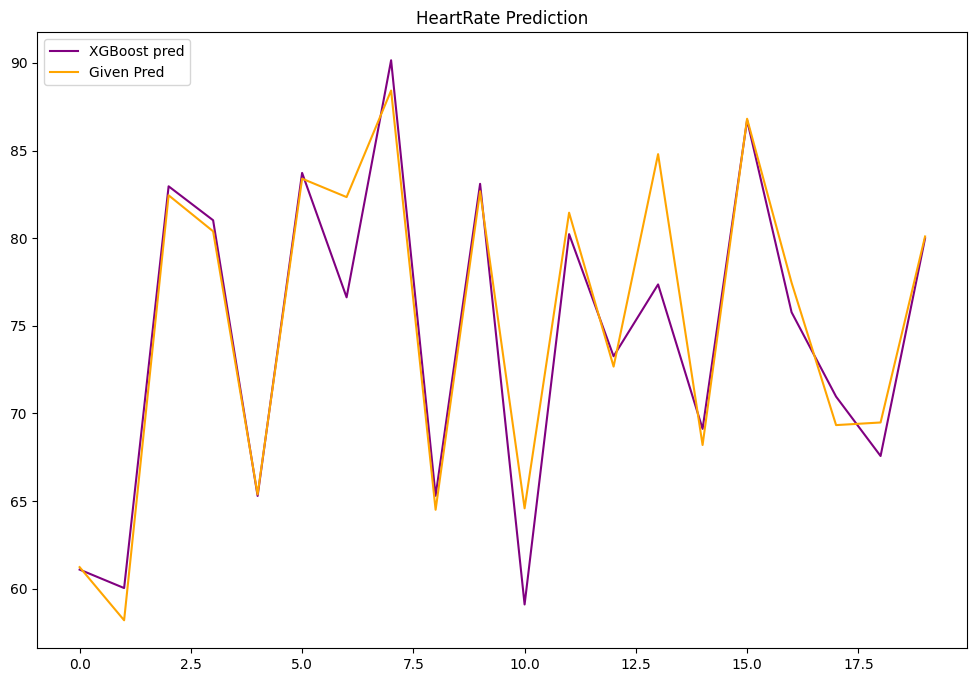

In [52]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_XGB[:20], color = 'purple', label="XGBoost pred")
plt.plot(range(0,20), y_valid[:20], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


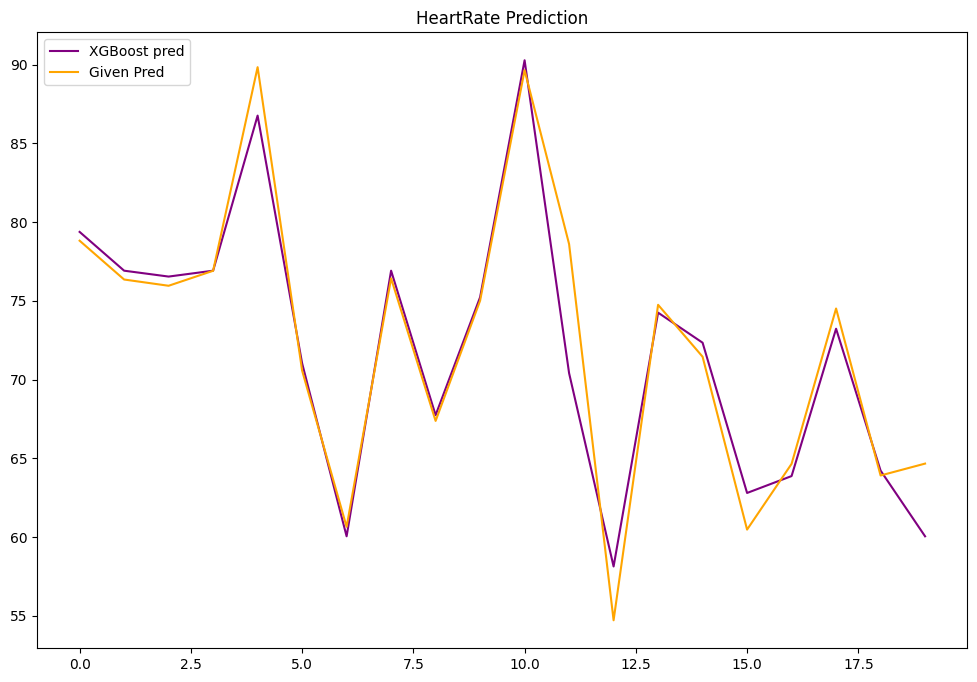

In [53]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_XGB[170:190], color = 'purple', label="XGBoost pred")
plt.plot(range(0,20), y_valid[170:190], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


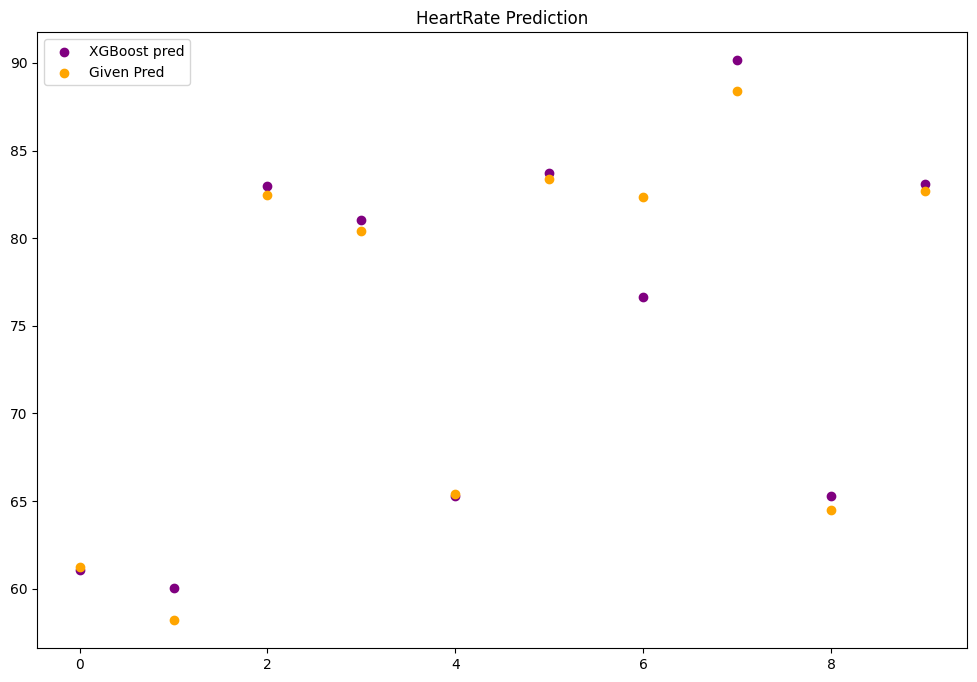

In [31]:
plt.figure(figsize=(12, 8))

plt.scatter(range(0,10), pred_XGB[:10], color = 'purple', label="XGBoost pred")
plt.scatter(range(0,10), y_valid[:10], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


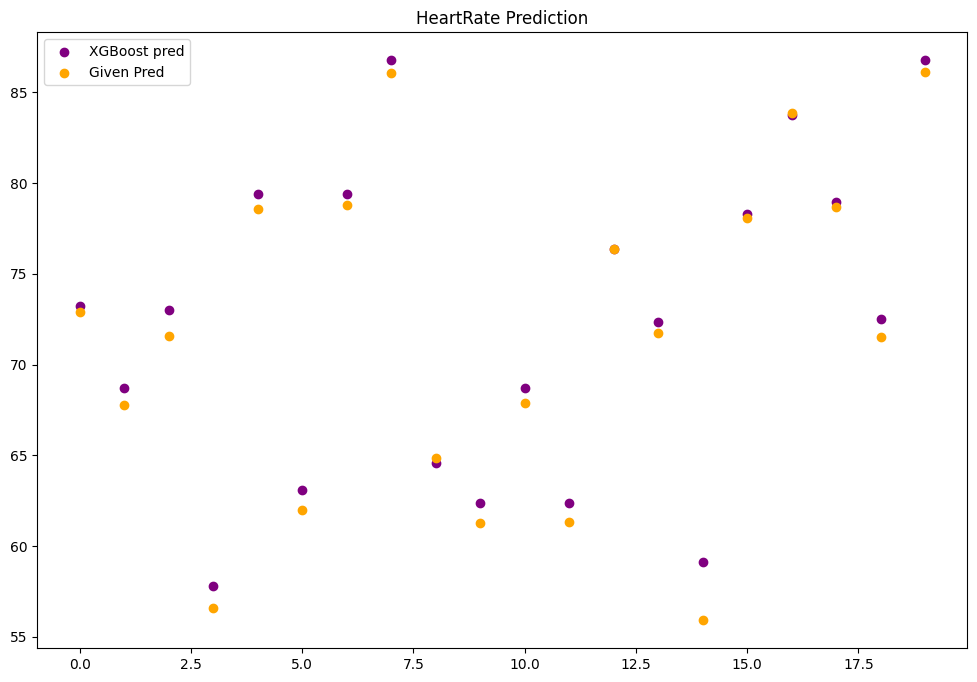

In [32]:
plt.figure(figsize=(12, 8))

plt.scatter(range(0,20), pred_XGB[330:350], color = 'purple', label="XGBoost pred")
plt.scatter(range(0,20), y_valid[330:350], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


In [110]:
#neural network model...

model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dense(32, activation='relu'),
    Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mse'])

history = model.fit(X_train, y_train, epochs=300, batch_size=20, verbose=1)




Epoch 1/300
225/225 [==============================] - 0s 634us/step - loss: 592.5439 - mse: 592.5439
Epoch 2/300
225/225 [==============================] - 0s 673us/step - loss: 454.6808 - mse: 454.6808
Epoch 3/300
225/225 [==============================] - 0s 699us/step - loss: 449.3722 - mse: 449.3722
Epoch 4/300
225/225 [==============================] - 0s 683us/step - loss: 458.2728 - mse: 458.2728
Epoch 5/300
225/225 [==============================] - 0s 682us/step - loss: 446.5582 - mse: 446.5582
Epoch 6/300
225/225 [==============================] - 0s 661us/step - loss: 451.4626 - mse: 451.4626
Epoch 7/300
225/225 [==============================] - 0s 655us/step - loss: 457.4213 - mse: 457.4213
Epoch 8/300
225/225 [==============================] - 0s 669us/step - loss: 440.5190 - mse: 440.5190
Epoch 9/300
225/225 [==============================] - 0s 663us/step - loss: 440.3355 - mse: 440.3355
Epoch 10/300
225/225 [==============================] - 0s 661us/step - loss: 440.

In [111]:
#prediction for nn...
pred_nn = model.predict(X_valid)

# Calculate R-squared score
r2 = r2_score(y_valid, pred_nn)
print("R-squared (R2) Score:", r2)

16/16 [==============================] - 0s 639us/step
R-squared (R2) Score: 0.9518533399077636


In [34]:
#neural network model...

model = Sequential([
    Dense(256, activation='relu', input_shape=(X.shape[1],)),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mse'])

history = model.fit(X_train, y_train, epochs=300, batch_size=20, verbose=1)




Epoch 1/300


2024-01-09 17:24:34.994726: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-09 17:24:34.996797: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2256] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


225/225 [==============================] - 1s 855us/step - loss: 524.1268 - mse: 524.1268
Epoch 2/300
225/225 [==============================] - 0s 848us/step - loss: 458.3232 - mse: 458.3232
Epoch 3/300
225/225 [==============================] - 0s 843us/step - loss: 458.1367 - mse: 458.1367
Epoch 4/300
225/225 [==============================] - 0s 807us/step - loss: 451.5443 - mse: 451.5443
Epoch 5/300
225/225 [==============================] - 0s 813us/step - loss: 447.9050 - mse: 447.9050
Epoch 6/300
225/225 [==============================] - 0s 808us/step - loss: 442.1472 - mse: 442.1472
Epoch 7/300
225/225 [==============================] - 0s 825us/step - loss: 438.6480 - mse: 438.6480
Epoch 8/300
225/225 [==============================] - 0s 806us/step - loss: 431.7482 - mse: 431.7483
Epoch 9/300
225/225 [==============================] - 0s 826us/step - loss: 430.1776 - mse: 430.1776
Epoch 10/300
225/225 [==============================] - 0s 836us/step - loss: 428.7206 - mse: 

In [35]:
#prediction for nn...
pred_nn = model.predict(X_valid)

# Calculate R-squared score
r2 = r2_score(y_valid, pred_nn)
print("R-squared (R2) Score:", r2)

16/16 [==============================] - 0s 722us/step
R-squared (R2) Score: 0.9603203315879331


In [36]:
#neural network model...

model = Sequential([
    Dense(512, activation='relu', input_shape=(X.shape[1],)),
    Dense(256, activation='relu'),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mse'])

history = model.fit(X_train, y_train, epochs=300, batch_size=20, verbose=1)




Epoch 1/300
225/225 [==============================] - 1s 2ms/step - loss: 482.0639 - mse: 482.0639
Epoch 2/300
225/225 [==============================] - 0s 2ms/step - loss: 472.9279 - mse: 472.9279
Epoch 3/300
225/225 [==============================] - 0s 1ms/step - loss: 453.1465 - mse: 453.1465
Epoch 4/300
225/225 [==============================] - 0s 1ms/step - loss: 450.7139 - mse: 450.7139
Epoch 5/300
225/225 [==============================] - 0s 1ms/step - loss: 456.9671 - mse: 456.9671
Epoch 6/300
225/225 [==============================] - 0s 1ms/step - loss: 441.5226 - mse: 441.5226
Epoch 7/300
225/225 [==============================] - 0s 1ms/step - loss: 430.0464 - mse: 430.0464
Epoch 8/300
225/225 [==============================] - 0s 1ms/step - loss: 427.7784 - mse: 427.7784
Epoch 9/300
225/225 [==============================] - 0s 1ms/step - loss: 419.6397 - mse: 419.6397
Epoch 10/300
225/225 [==============================] - 0s 1ms/step - loss: 416.0437 - mse: 416.0437

In [37]:
#prediction for nn...
pred_nn = model.predict(X_valid)

# Calculate R-squared score
r2 = r2_score(y_valid, pred_nn)
print("R-squared (R2) Score:", r2)

16/16 [==============================] - 0s 924us/step
R-squared (R2) Score: 0.9605128452658376


In [38]:
#neural network model...

model = Sequential([
    Dense(1024, activation='relu', input_shape=(X.shape[1],)),
    Dense(512, activation='relu'),
    Dense(256, activation='relu'),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mse'])

history = model.fit(X_train, y_train, epochs=300, batch_size=20, verbose=1)




Epoch 1/300
225/225 [==============================] - 3s 9ms/step - loss: 534.7363 - mse: 534.7363
Epoch 2/300
225/225 [==============================] - 2s 8ms/step - loss: 475.8304 - mse: 475.8304
Epoch 3/300
225/225 [==============================] - 2s 9ms/step - loss: 464.8072 - mse: 464.8072
Epoch 4/300
225/225 [==============================] - 2s 9ms/step - loss: 460.2003 - mse: 460.2003
Epoch 5/300
225/225 [==============================] - 3s 12ms/step - loss: 453.4508 - mse: 453.4508
Epoch 6/300
225/225 [==============================] - 2s 10ms/step - loss: 441.7941 - mse: 441.7941
Epoch 7/300
225/225 [==============================] - 2s 9ms/step - loss: 445.8343 - mse: 445.8343
Epoch 8/300
225/225 [==============================] - 2s 9ms/step - loss: 434.8578 - mse: 434.8578
Epoch 9/300
225/225 [==============================] - 2s 8ms/step - loss: 433.1360 - mse: 433.1360
Epoch 10/300
225/225 [==============================] - 2s 8ms/step - loss: 425.6124 - mse: 425.61

In [40]:
#prediction for nn...
pred_nn = model.predict(X_valid)

# Calculate R-squared score
r2 = r2_score(y_valid, pred_nn)
print("R-squared (R2) Score:", r2)

16/16 [==============================] - 0s 2ms/step
R-squared (R2) Score: 0.963600362655268


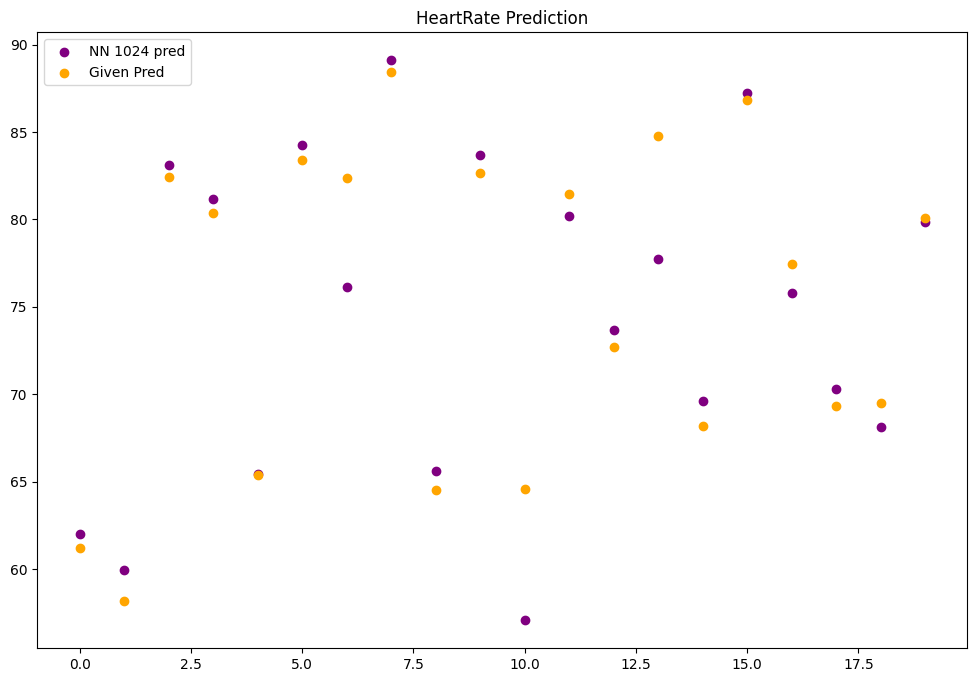

In [45]:
plt.figure(figsize=(12, 8))

plt.scatter(range(0,20), pred_nn[:20], color = 'purple', label="NN 1024 pred")
plt.scatter(range(0,20), y_valid[:20], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


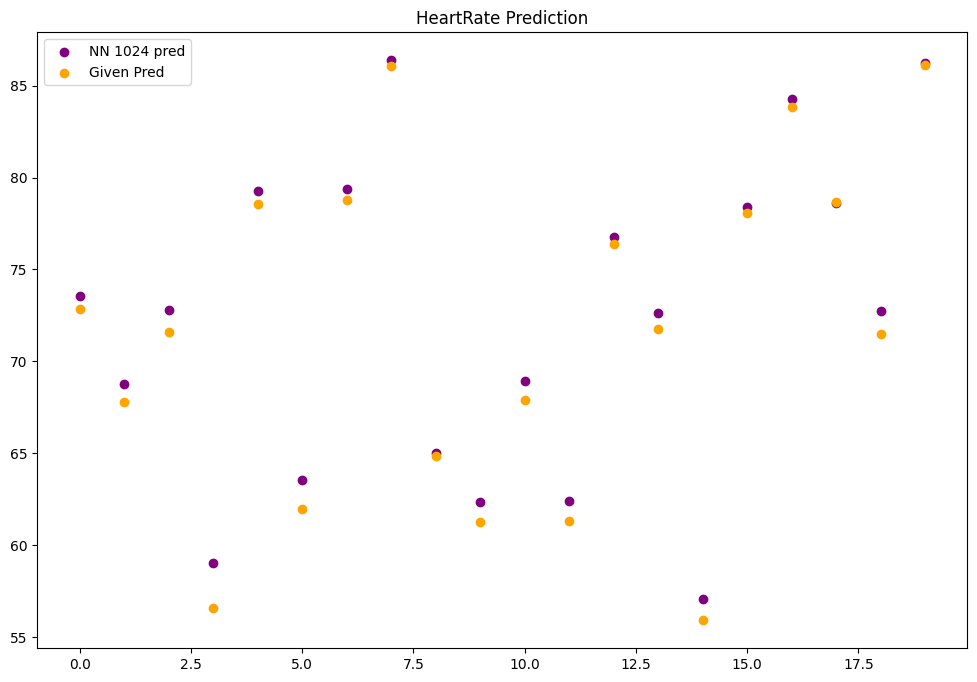

In [48]:
plt.figure(figsize=(12, 8))

plt.scatter(range(0,20), pred_nn[330:350], color = 'purple', label="NN 1024 pred")
plt.scatter(range(0,20), y_valid[330:350], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


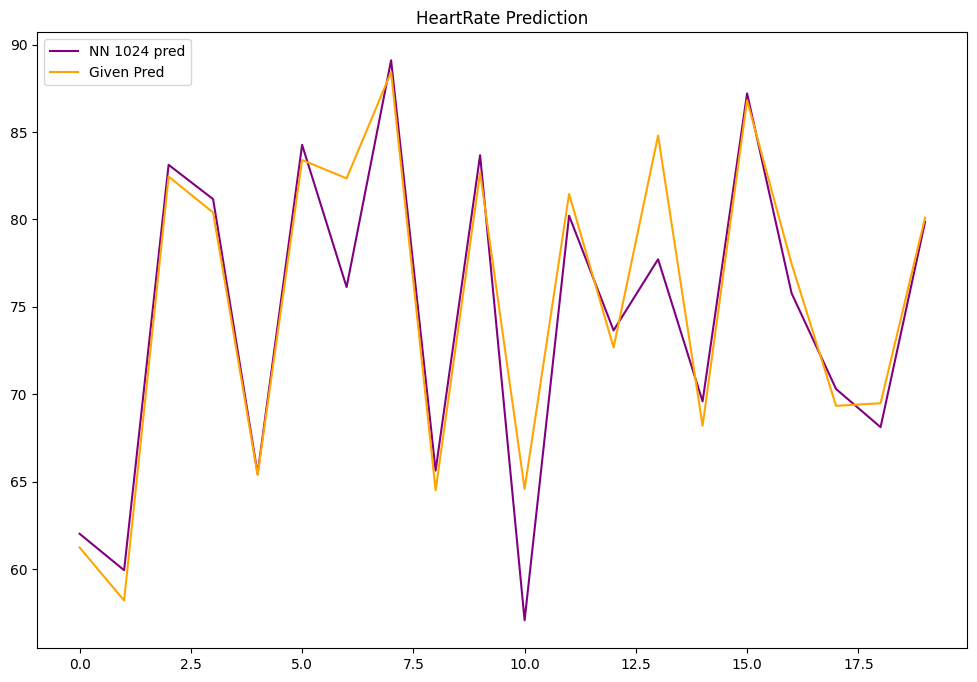

In [46]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_nn[:20], color = 'purple', label="NN 1024 pred")
plt.plot(range(0,20), y_valid[:20], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


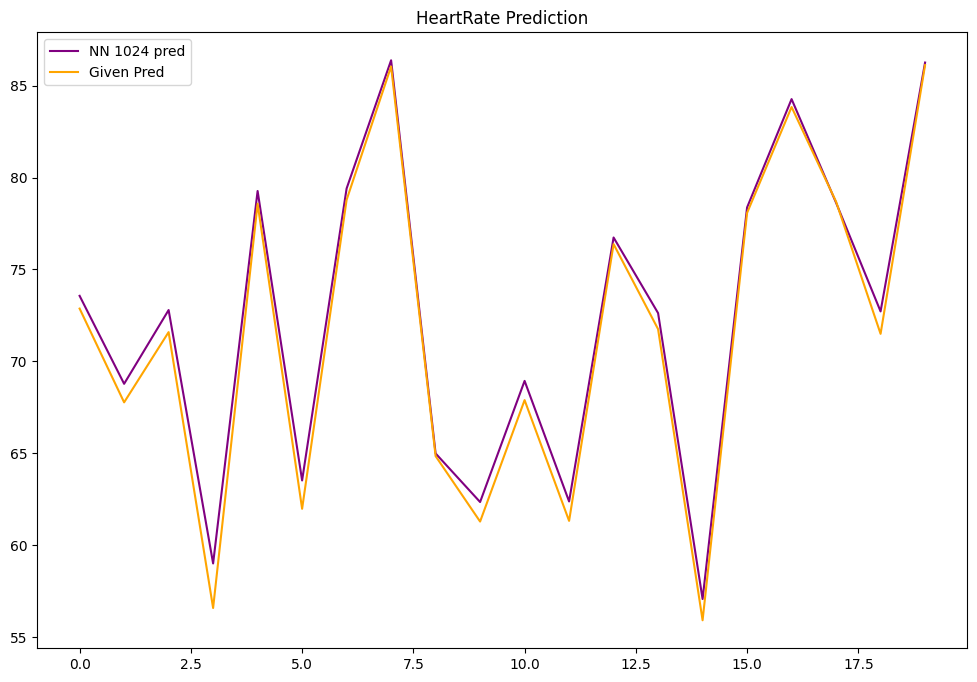

In [47]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_nn[330:350], color = 'purple', label="NN 1024 pred")
plt.plot(range(0,20), y_valid[330:350], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


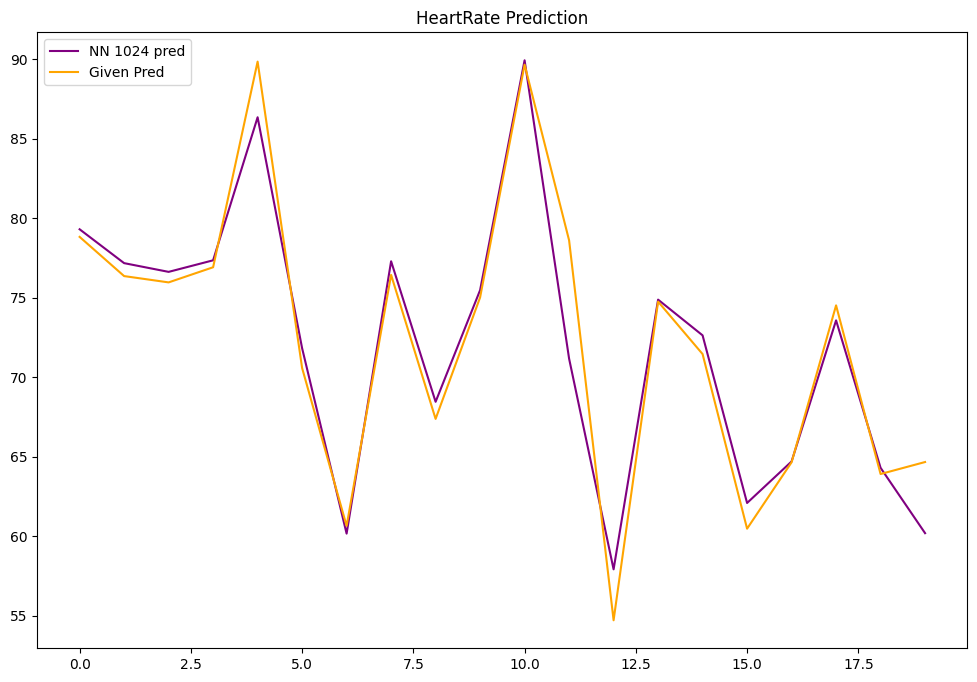

In [51]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_nn[170:190], color = 'purple', label="NN 1024 pred")
plt.plot(range(0,20), y_valid[170:190], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


In [41]:
#neural network model...

model = Sequential([
    Dense(1024, activation='relu', input_shape=(X.shape[1],)),
    Dense(512, activation='relu'),
    Dense(256, activation='relu'),
    Dense(512, activation='relu'),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mse'])

history = model.fit(X_train, y_train, epochs=300, batch_size=20, verbose=1)




Epoch 1/300
225/225 [==============================] - 3s 12ms/step - loss: 542.1251 - mse: 542.1251
Epoch 2/300
225/225 [==============================] - 2s 10ms/step - loss: 480.6503 - mse: 480.6503
Epoch 3/300
225/225 [==============================] - 2s 10ms/step - loss: 474.5955 - mse: 474.5955
Epoch 4/300
225/225 [==============================] - 2s 10ms/step - loss: 456.5756 - mse: 456.5756
Epoch 5/300
225/225 [==============================] - 2s 10ms/step - loss: 457.8764 - mse: 457.8764
Epoch 6/300
225/225 [==============================] - 2s 11ms/step - loss: 446.7396 - mse: 446.7396
Epoch 7/300
225/225 [==============================] - 2s 10ms/step - loss: 431.6104 - mse: 431.6104
Epoch 8/300
225/225 [==============================] - 2s 11ms/step - loss: 424.7440 - mse: 424.7440
Epoch 9/300
225/225 [==============================] - 2s 10ms/step - loss: 427.5469 - mse: 427.5469
Epoch 10/300
225/225 [==============================] - 2s 10ms/step - loss: 401.7422 - mse

In [20]:
#prediction for nn...
pred_nn = model.predict(X_valid)

# Calculate R-squared score
r2 = r2_score(y_valid, pred_nn)
print("R-squared (R2) Score:", r2)

R-squared (R2) Score: 0.9027411873262654


In [50]:
#experimenting with XGBoost...
#print("regressor xgb")
#param_grid = {
   # 'n_estimators': [10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100],
   # 'max_depth': [1,2, 3, 4, 5, 6, 7, 8, 9, 10,11 , 12, 13, 14 , 15, 16, 17, 18, 19, 20],
   # 'learning_rate': [2, 1.8, 1.5, 1.25,1, 0.1, 0.01, 0.001, 0.001]
    
#}

# Initialize XGBoost regressor
#xgb_model = XGBRegressor()

# Create GridSearchCV instance
#grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, scoring='r2')

# Fit GridSearchCV to find the best hyperparameters
#grid_search.fit(X_train, y_train)

# Get the best parameters and best estimator
#best_params = grid_search.best_params_
#print(best_params)
#best_model = grid_search.best_estimator_

# Evaluate the best model
#best_model.fit(X_train, y_train)
#XGB_new = best_model.predict(X_valid)
r2 = r2_score(y_valid, XGB_new)
mse = mean_squared_error(y_valid, XGB_new)

print("Best R-squared (R2) Score:", r2)
print("Best MSE Score:", mse)

NameError: name 'XGB_new' is not defined

In [52]:
# XGBoost model after Gridsearch...

model = XGBRegressor(max_depth=4, learning_rate=0.1, n_estimators=64)

model.fit(X_train, y_train)

pred_xgb_updated = model.predict(X_valid)

# Evaluate model performance
r2 = r2_score(y_valid, pred_xgb_updated)
mse = mean_squared_error(y_valid, pred_xgb_updated)

print("R-squared (R2) Score:", r2)
print("mse) Score:", mse)

R-squared (R2) Score: 0.9867849116193596
mse) Score: 1.3823186104962575


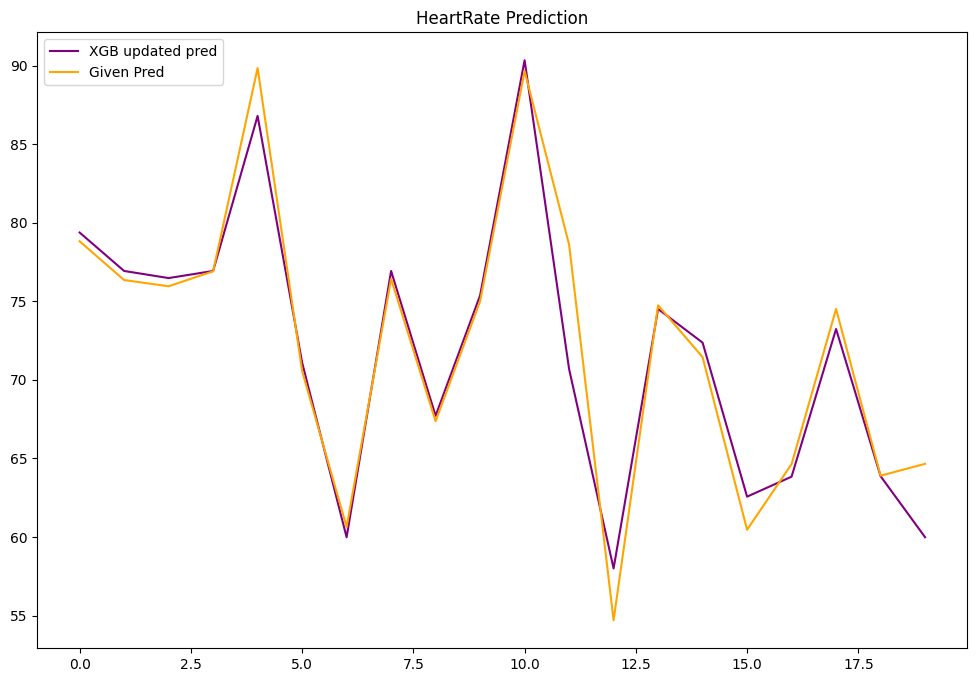

In [38]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_xgb_updated[170:190], color = 'purple', label="XGB updated pred")
plt.plot(range(0,20), y_valid[170:190], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


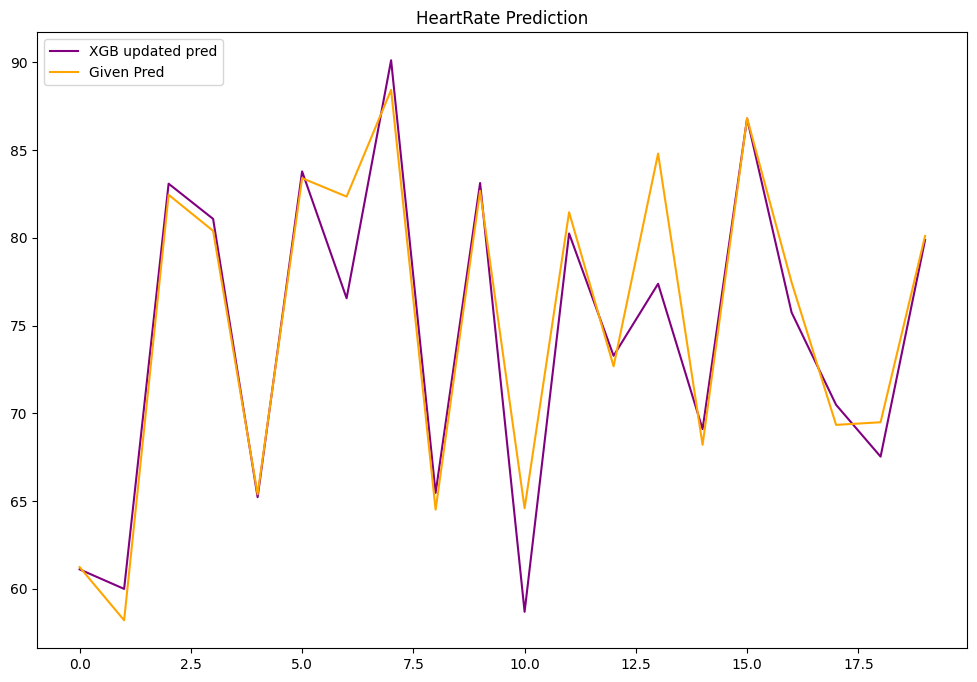

In [36]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_xgb_updated[:20], color = 'purple', label="XGB updated pred")
plt.plot(range(0,20), y_valid[:20], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


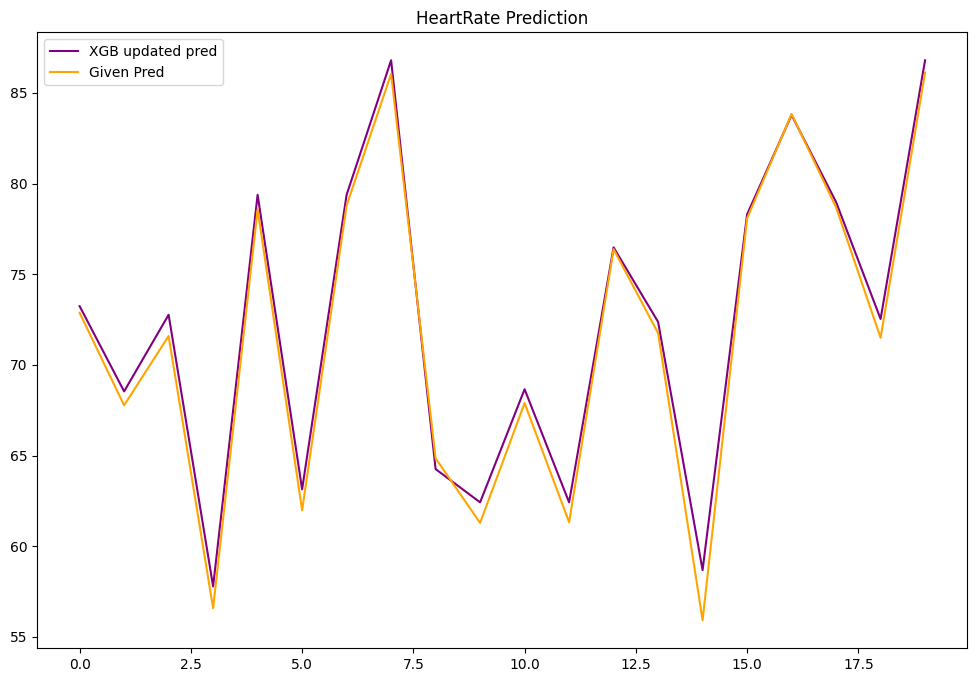

In [37]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_xgb_updated[330:350], color = 'purple', label="XGB updated pred")
plt.plot(range(0,20), y_valid[330:350], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


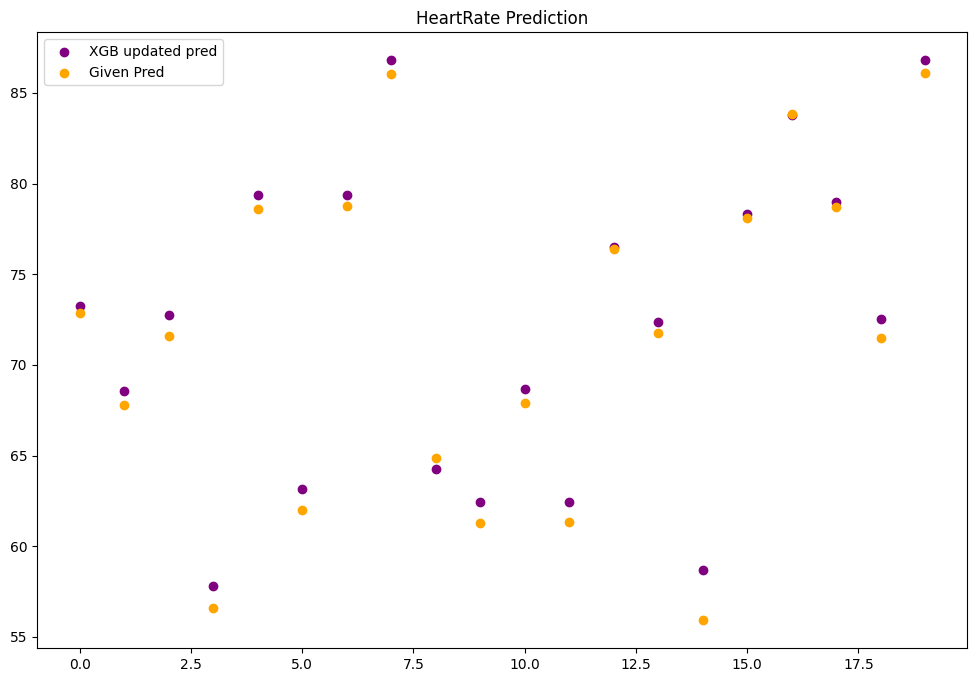

In [39]:
plt.figure(figsize=(12, 8))

plt.scatter(range(0,20), pred_xgb_updated[330:350], color = 'purple', label="XGB updated pred")
plt.scatter(range(0,20), y_valid[330:350], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


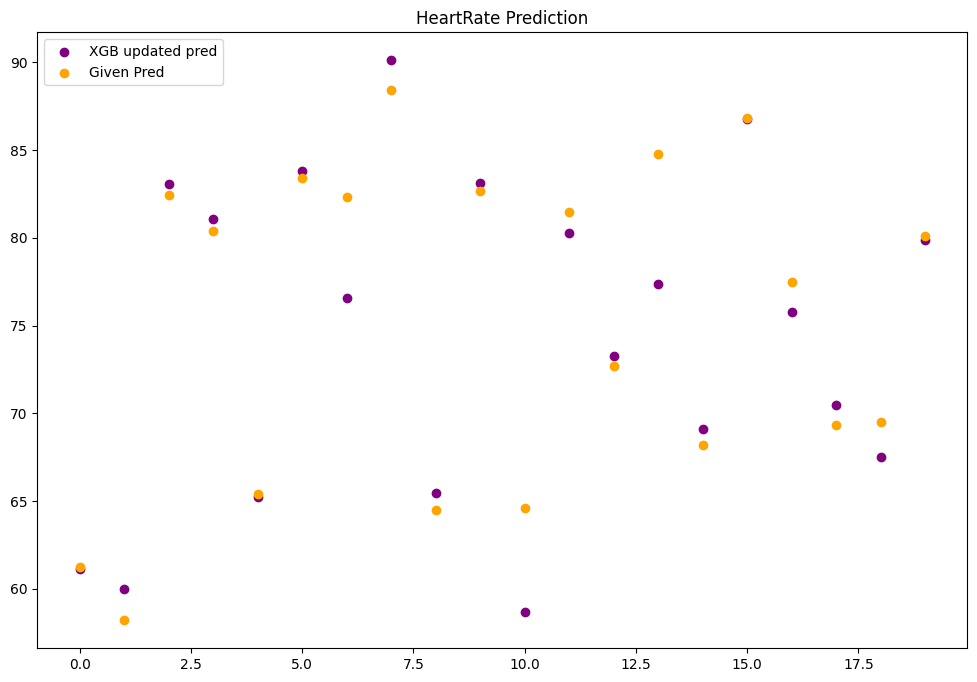

In [40]:
plt.figure(figsize=(12, 8))

plt.scatter(range(0,20), pred_xgb_updated[:20], color = 'purple', label="XGB updated pred")
plt.scatter(range(0,20), y_valid[:20], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


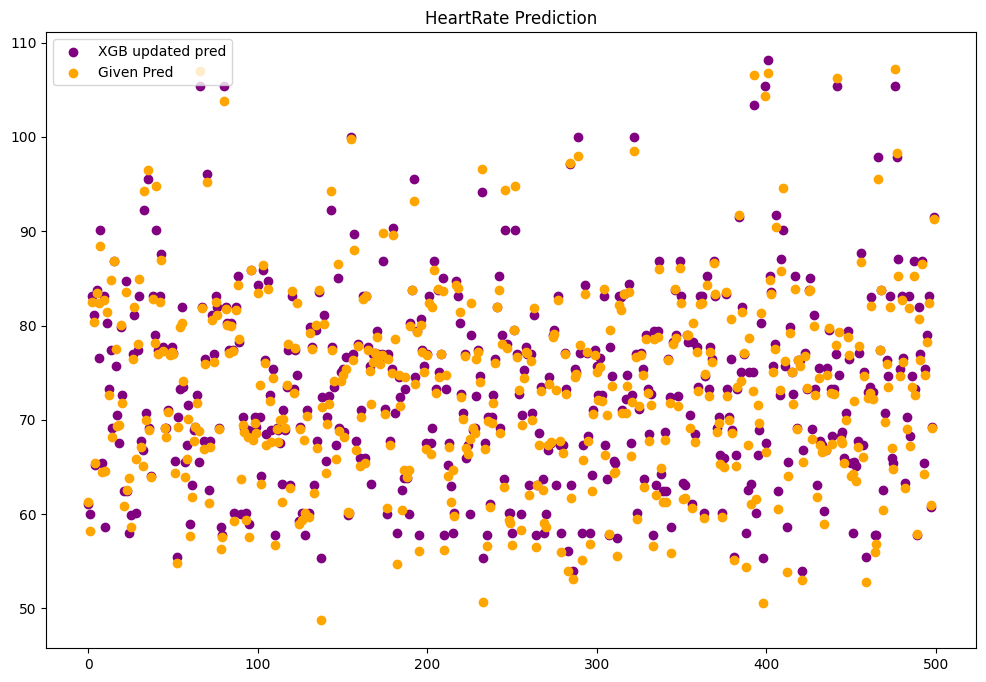

In [42]:
plt.figure(figsize=(12, 8))

plt.scatter(range(0,500), pred_xgb_updated[:], color = 'purple', label="XGB updated pred")
plt.scatter(range(0,500), y_valid[:], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


In [66]:
# POLYNOMIAL FEATURE USAGE...


selected_features = ['MEAN_RR', 'MEDIAN_RR']
X = data[selected_features]
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.1, random_state=42)


In [55]:
# POLYNOMIAL XGB MODEL with mean_rr and median_rr...

model = XGBRegressor(max_depth=4, learning_rate=0.1, n_estimators=64)

model.fit(X_train, y_train)

pred_poly_xgb = model.predict(X_valid)

r2 = r2_score(y_valid, pred_poly_xgb)
mse = mean_squared_error(y_valid, pred_poly_xgb)

print("R-squared (R2) Score:", r2)
print("Mean Squared Error (MSE):", mse)

R-squared (R2) Score: 0.9867849116193596
Mean Squared Error (MSE): 1.3823186104962575


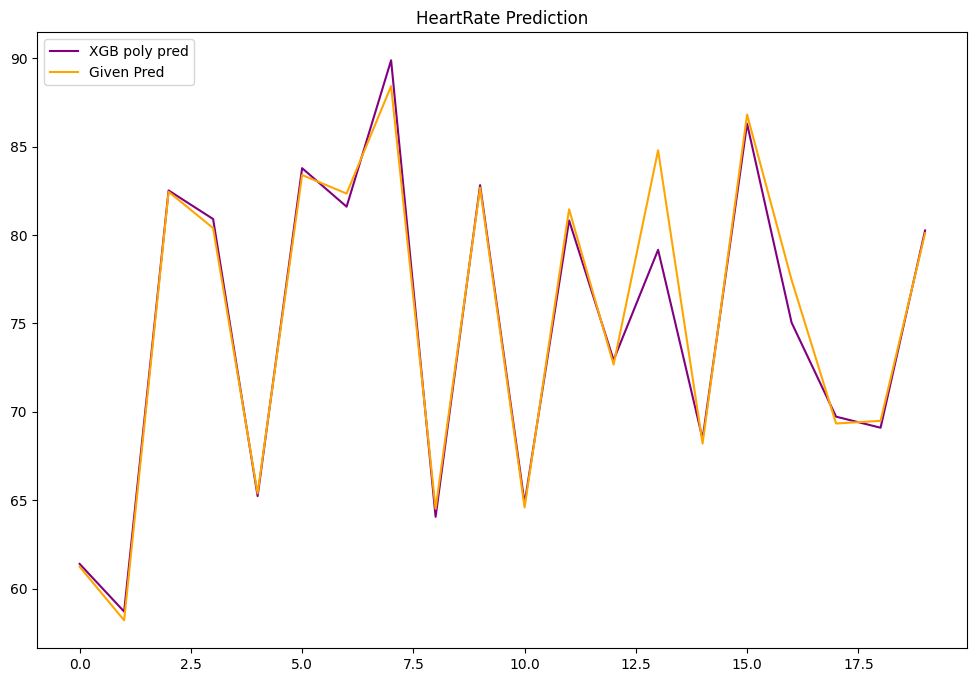

In [56]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_poly_xgb[:20], color = 'purple', label="XGB poly pred")
plt.plot(range(0,20), y_valid[:20], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


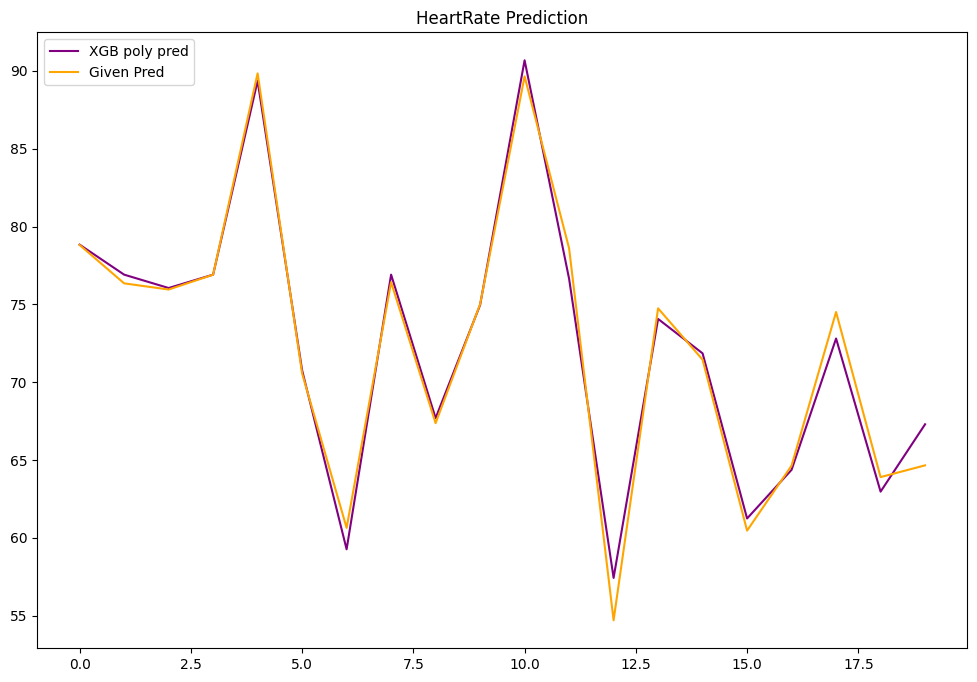

In [57]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_poly_xgb[170:190], color = 'purple', label="XGB poly pred")
plt.plot(range(0,20), y_valid[170:190], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


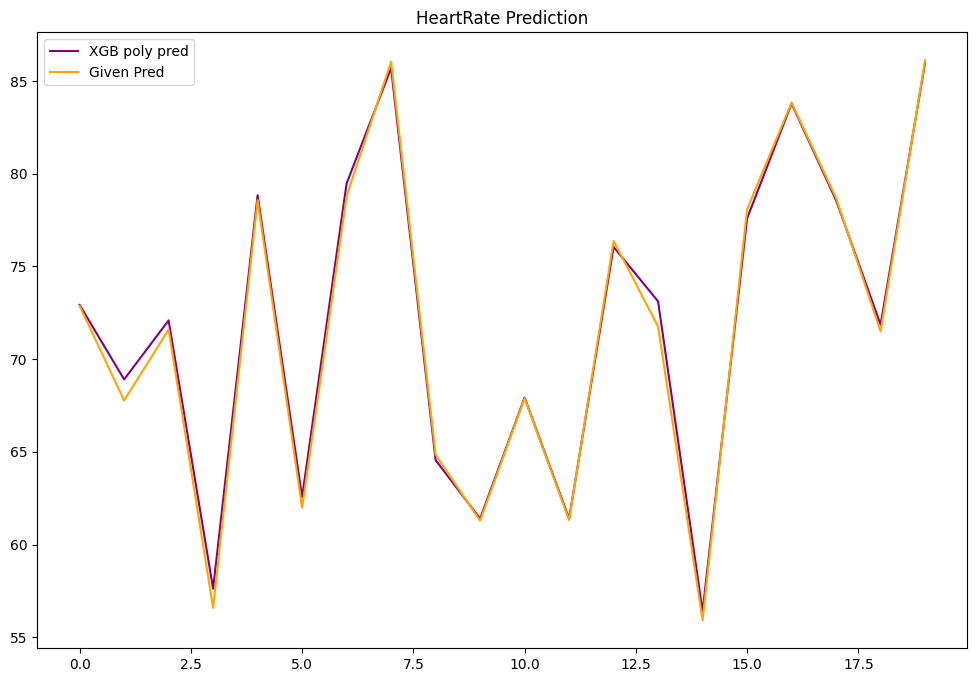

In [58]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_poly_xgb[330:350], color = 'purple', label="XGB poly pred")
plt.plot(range(0,20), y_valid[330:350], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


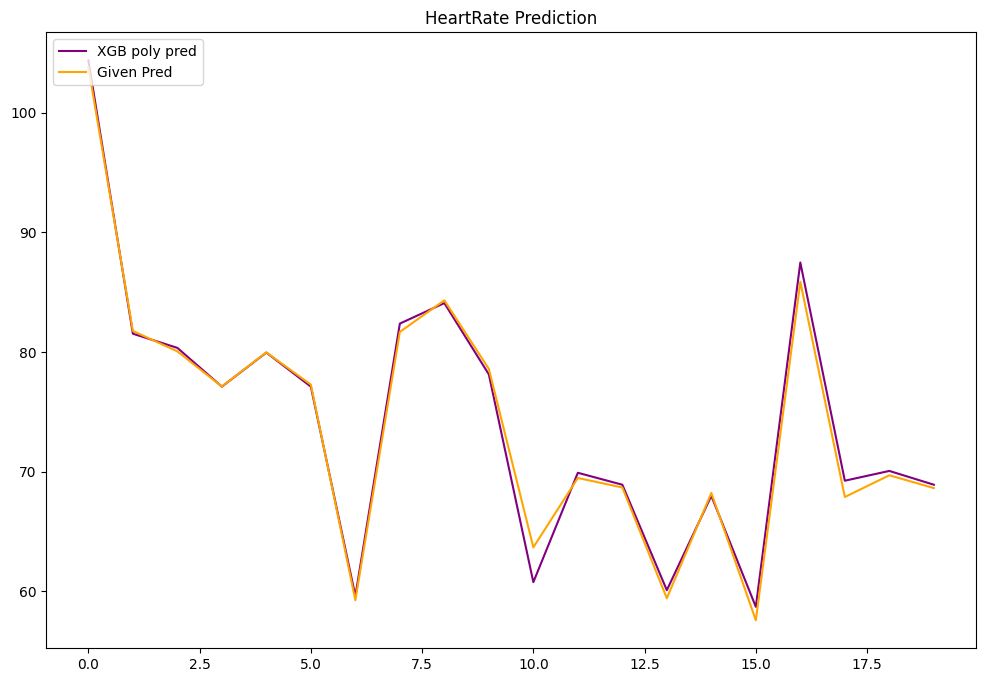

In [59]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_poly_xgb[80:100], color = 'purple', label="XGB poly pred")
plt.plot(range(0,20), y_valid[80:100], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


In [67]:
# POLYNOMIAL FEATURE USAGE...


selected_features = ['MEAN_RR', 'MEDIAN_RR','SDRR_RMSSD_REL_RR']
X = data[selected_features]
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.1, random_state=42)


In [68]:
# POLYNOMIAL XGB MODEL with mean_rr and median_rr and sdrr_rmssd_rel_rr...

model = XGBRegressor(max_depth=4, learning_rate=0.1, n_estimators=64)

model.fit(X_train, y_train)

pred_poly_xgb = model.predict(X_valid)

r2 = r2_score(y_valid, pred_poly_xgb)
mse = mean_squared_error(y_valid, pred_poly_xgb)

print("R-squared (R2) Score:", r2)
print("Mean Squared Error (MSE):", mse)

R-squared (R2) Score: 0.9915314753075888
Mean Squared Error (MSE): 0.885820733739187


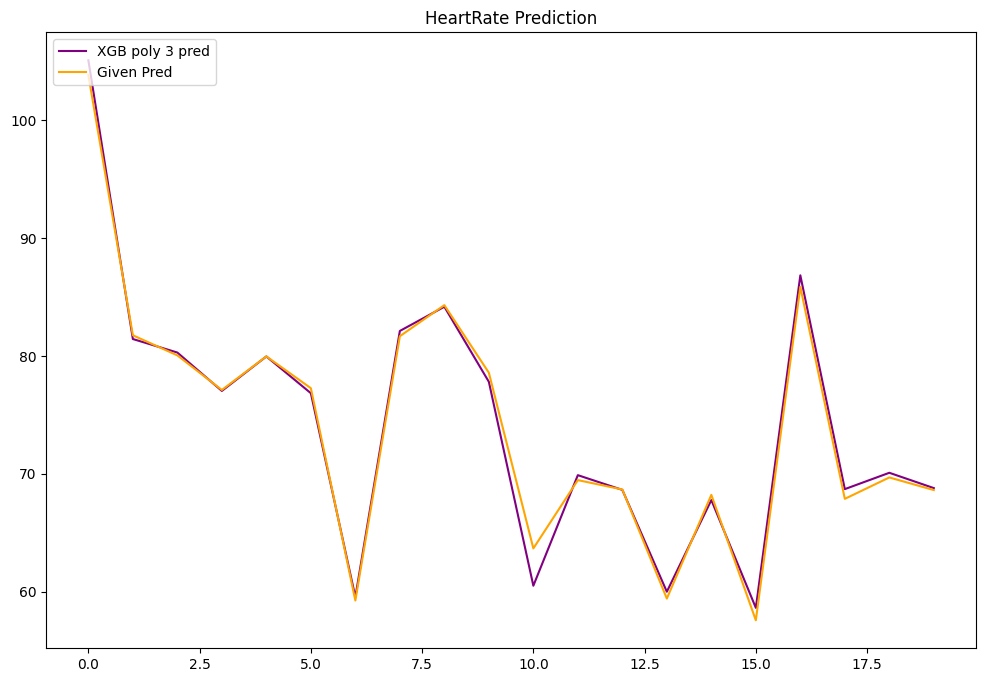

In [69]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_poly_xgb[80:100], color = 'purple', label="XGB poly 3 pred")
plt.plot(range(0,20), y_valid[80:100], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


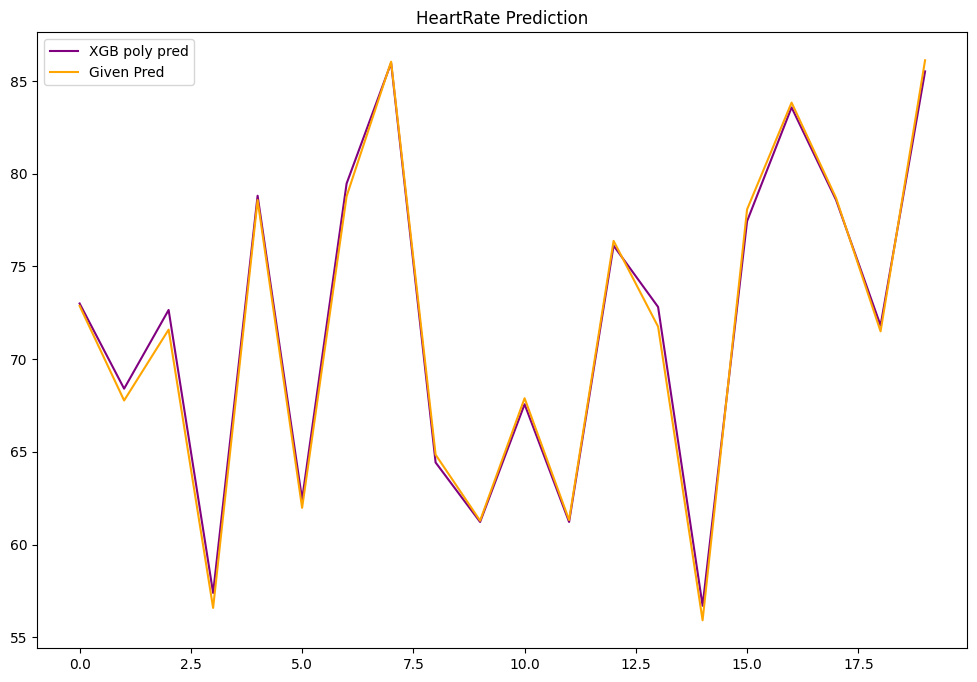

In [70]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_poly_xgb[330:350], color = 'purple', label="XGB poly pred")
plt.plot(range(0,20), y_valid[330:350], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


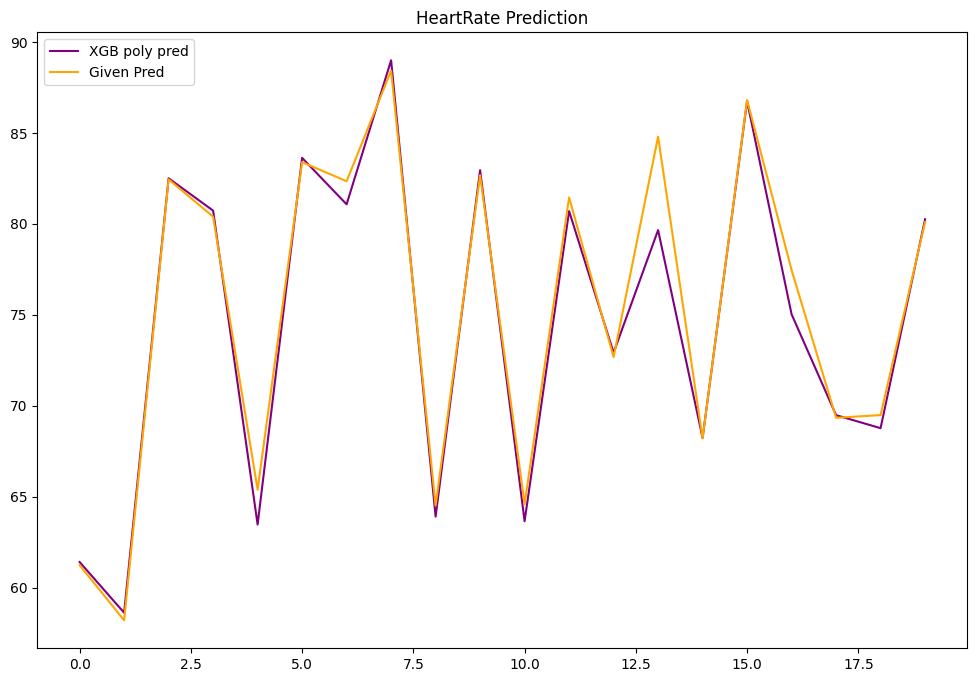

In [71]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_poly_xgb[:20], color = 'purple', label="XGB poly pred")
plt.plot(range(0,20), y_valid[:20], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


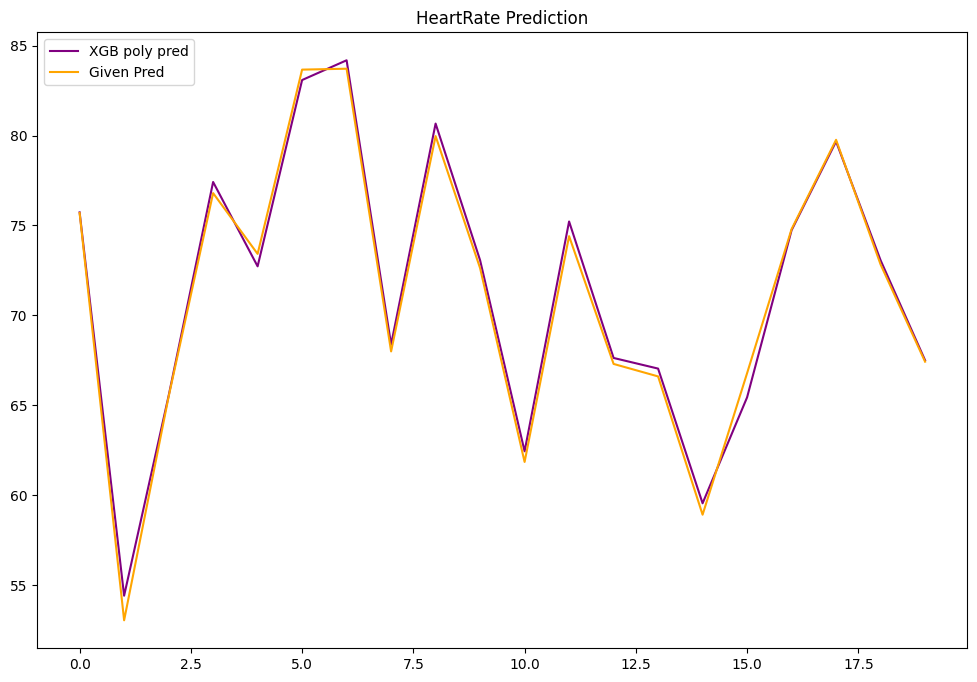

In [72]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_poly_xgb[420:440], color = 'purple', label="XGB poly pred")
plt.plot(range(0,20), y_valid[420:440], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


In [281]:
# POLYNOMIAL FEATURE USAGE...


selected_features = ['MEAN_RR', 'MEDIAN_RR','SDRR_RMSSD_REL_RR', 'LF_NU', 'HF_NU', 'HF_PCT','HF_LF','RMSSD', 'SDSD','pNN25', 'pNN50','SDRR_REL_RR', 'SDSD_REL_RR','VLF','TP','KURT','SD2', 'LF']
X = data[selected_features]
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.1, random_state=42)


In [19]:
# POLYNOMIAL XGB MODEL with mean_rr and median_rr and sdrr_rmssd_rel_rr and lf_nu and hf_pct...

model = XGBRegressor(max_depth=4, learning_rate=0.1, n_estimators=64)

model.fit(X_train, y_train)

pred_poly_xgb = model.predict(X_valid)

r2 = r2_score(y_valid, pred_poly_xgb)
mse = mean_squared_error(y_valid, pred_poly_xgb)

print("R-squared (R2) Score:", r2)
print("Mean Squared Error (MSE):", mse)

R-squared (R2) Score: 0.9976044469144592
Mean Squared Error (MSE): 0.25057854455411477


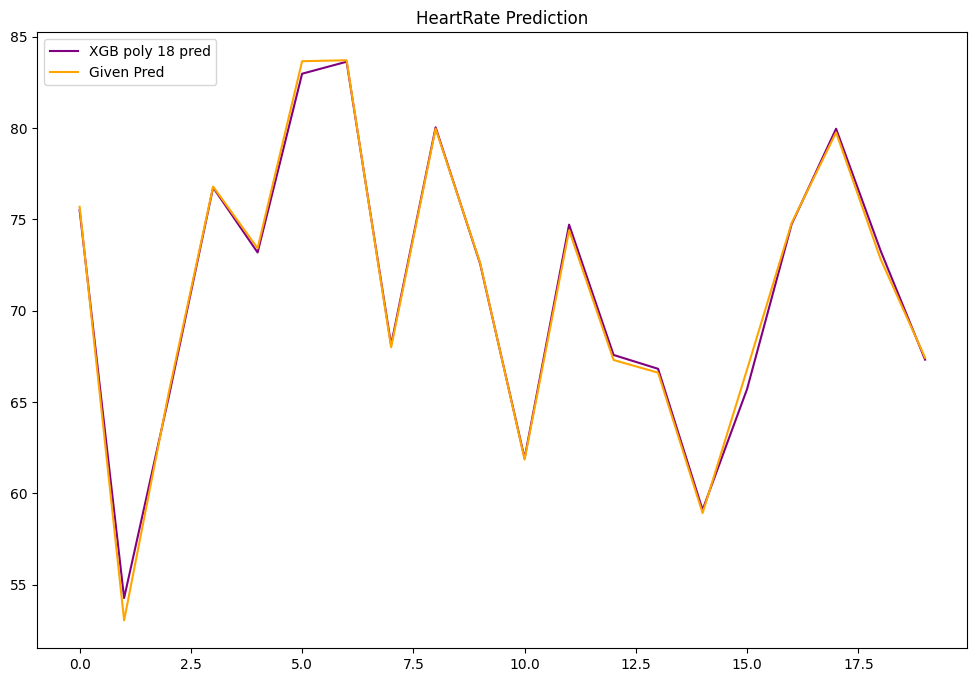

In [292]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_poly_xgb[420:440], color = 'purple', label="XGB poly 18 pred")
plt.plot(range(0,20), y_valid[420:440], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


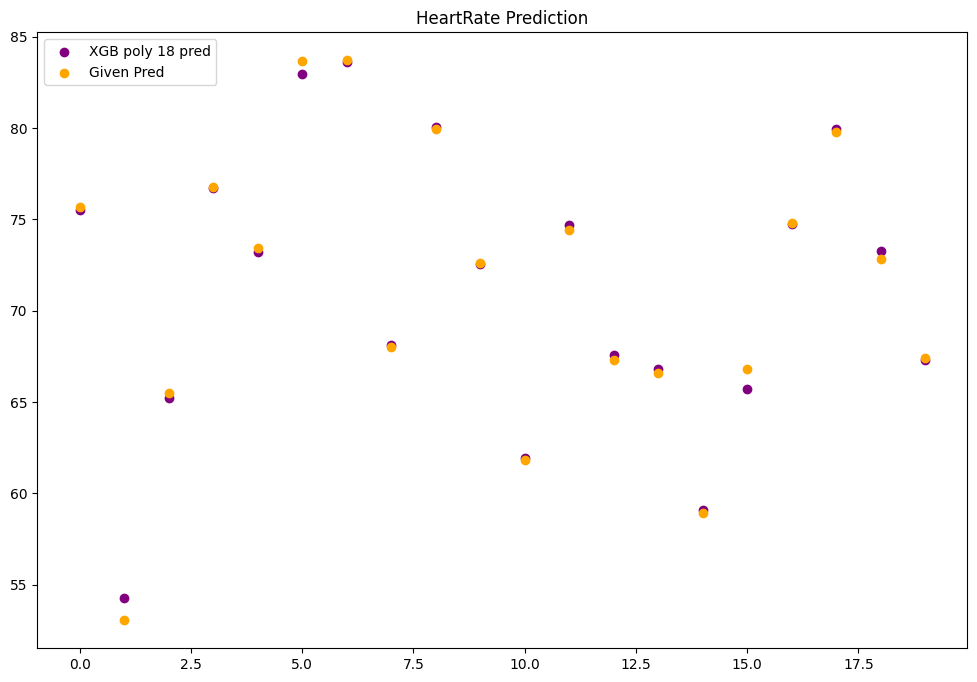

In [293]:
plt.figure(figsize=(12, 8))

plt.scatter(range(0,20), pred_poly_xgb[420:440], color = 'purple', label="XGB poly 18 pred")
plt.scatter(range(0,20), y_valid[420:440], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


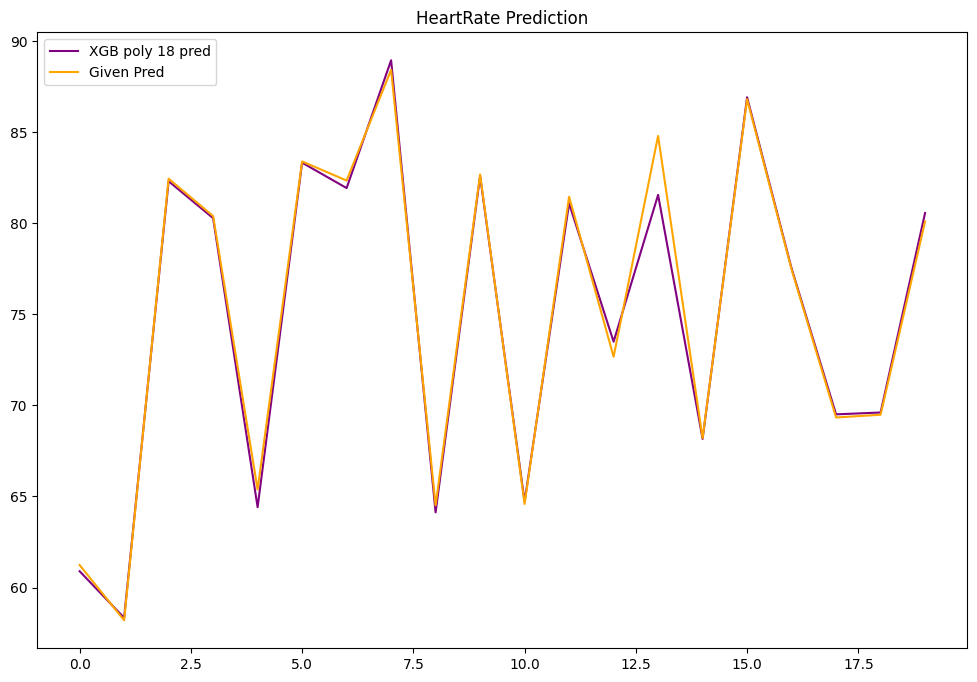

In [294]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_poly_xgb[:20], color = 'purple', label="XGB poly 18 pred")
plt.plot(range(0,20), y_valid[:20], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


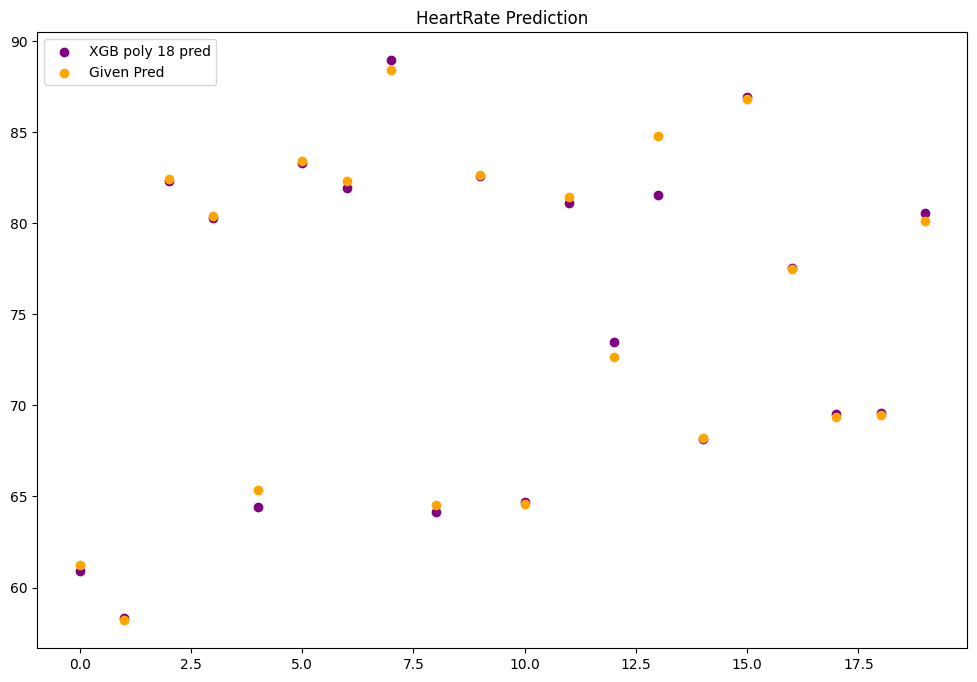

In [296]:
plt.figure(figsize=(12, 8))

plt.scatter(range(0,20), pred_poly_xgb[:20], color = 'purple', label="XGB poly 18 pred")
plt.scatter(range(0,20), y_valid[:20], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


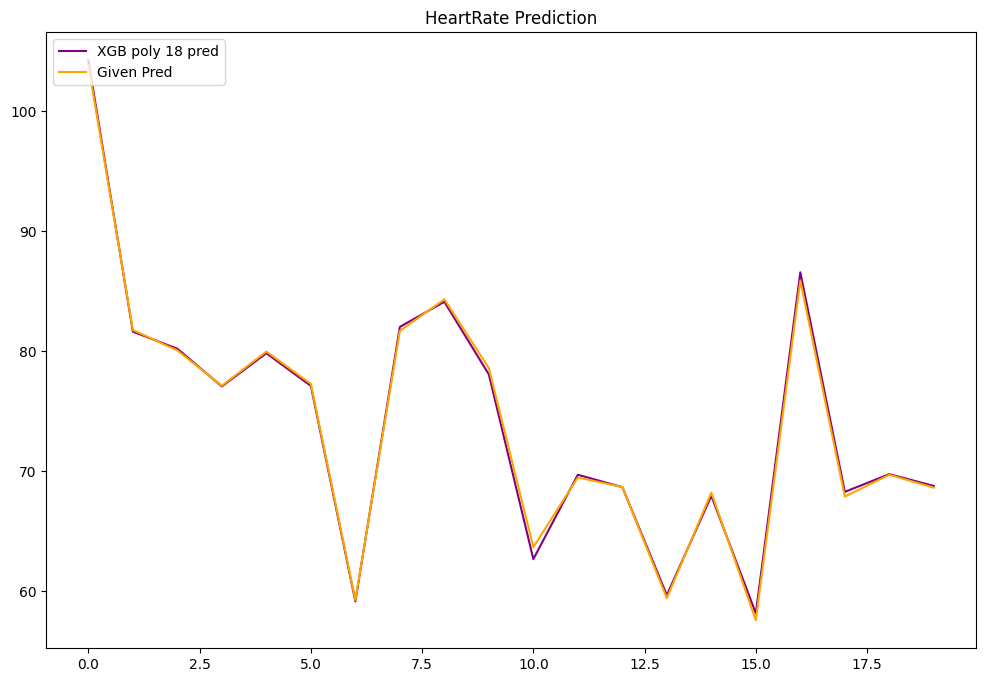

In [297]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_poly_xgb[80:100], color = 'purple', label="XGB poly 18 pred")
plt.plot(range(0,20), y_valid[80:100], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


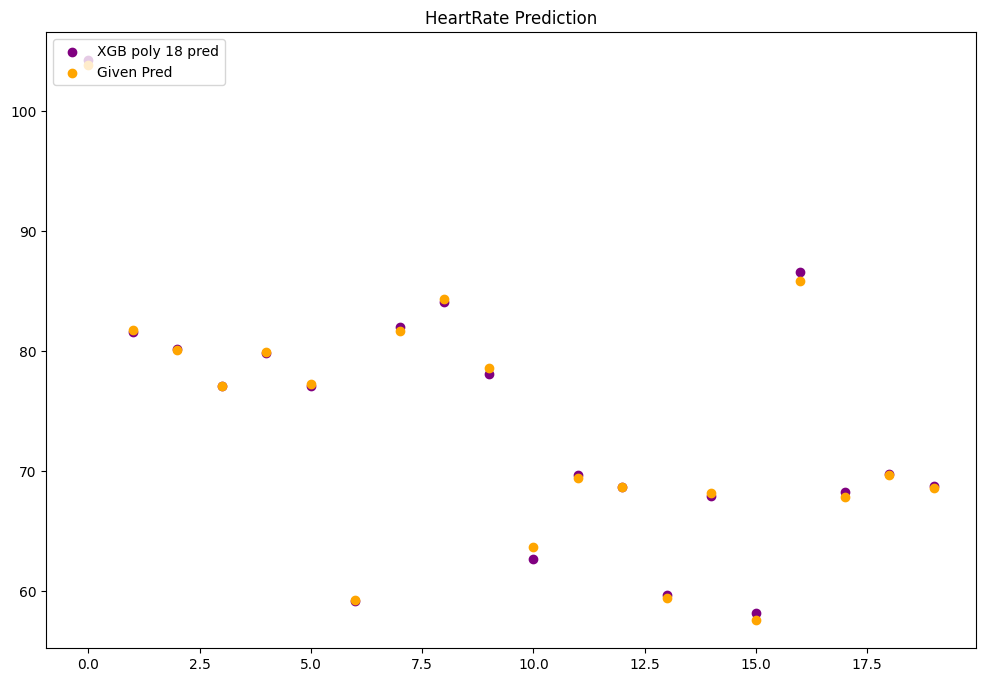

In [298]:
plt.figure(figsize=(12, 8))

plt.scatter(range(0,20), pred_poly_xgb[80:100], color = 'purple', label="XGB poly 18 pred")
plt.scatter(range(0,20), y_valid[80:100], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


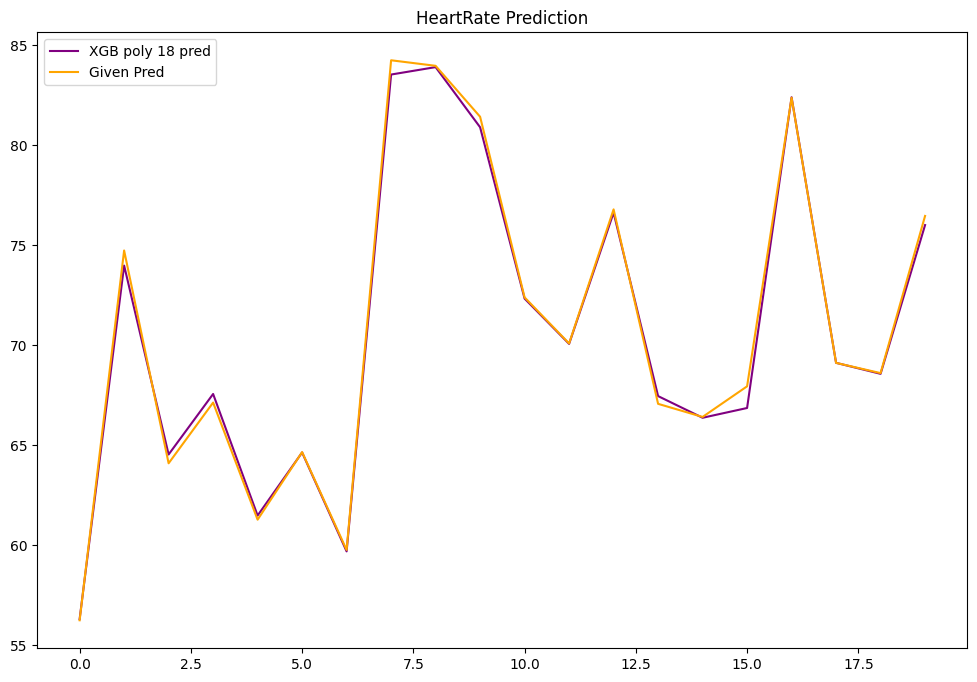

In [299]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_poly_xgb[210:230], color = 'purple', label="XGB poly 18 pred")
plt.plot(range(0,20), y_valid[210:230], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


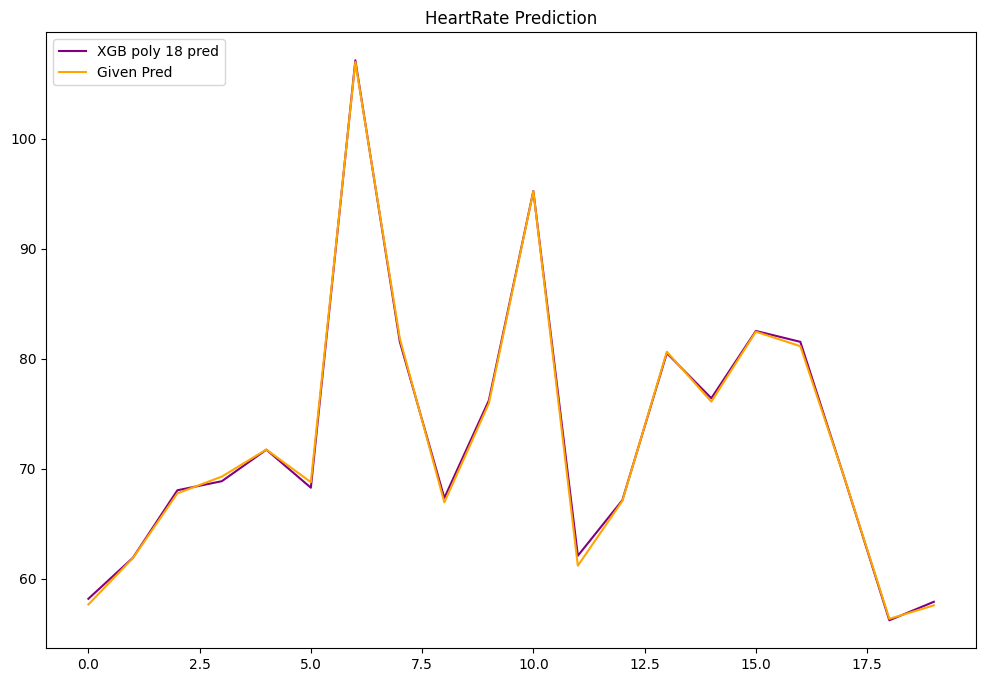

In [300]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_poly_xgb[60:80], color = 'purple', label="XGB poly 18 pred")
plt.plot(range(0,20), y_valid[60:80], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


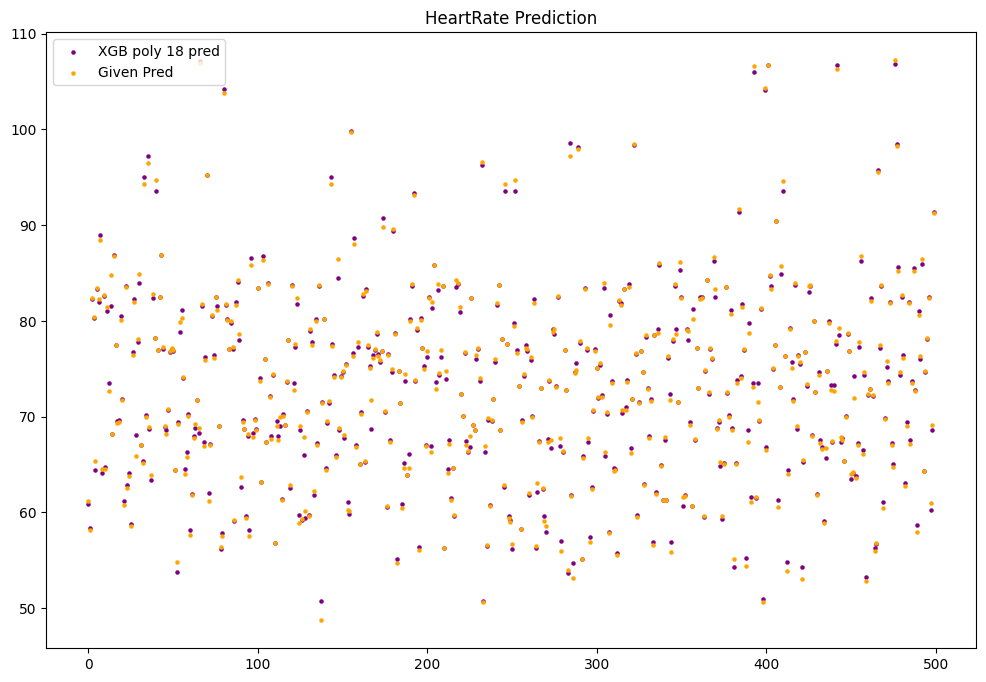

In [301]:
plt.figure(figsize=(12, 8))

plt.scatter(range(0,500), pred_poly_xgb[:], color = 'purple', label="XGB poly 18 pred", s = 5)
plt.scatter(range(0,500), y_valid[:], color = 'orange', label="Given Pred", s = 5)
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


In [10]:
# LightGBM try out...

param_grid = {
    'n_estimators': [10, 25,  50, 75,  90, 100],
   'max_depth': [1,2, 3, 4, 5,  7,  10],
   'learning_rate': [1, 0.1, 0.01, 0.001]
    
}
lgbm_model = LGBMRegressor()

grid_search = GridSearchCV(estimator=lgbm_model, param_grid=param_grid, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
best_lgbm_model = grid_search.best_estimator_
print(best_params)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8231
[LightGBM] [Info] Number of data points in the train set: 3600, number of used features: 36
[LightGBM] [Info] Start training from score 74.093910
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8233
[LightGBM] [Info] Number of data points in the train set: 3600, number of used features: 36
[LightGBM] [Info] Start training from score 74.157370
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of te

In [25]:
# LightGBM try out...

#param_grid = {
   # 'n_estimators': [10, 25,  50, 75,  90, 100],
   #'max_depth': [1,5,  7,  10, 12, 14, 16, 18, 20],
   #'learning_rate': [1, 0.1, 0.01, 0.001]
    
#}
#lgbm_model = LGBMRegressor()

#grid_search = GridSearchCV(estimator=lgbm_model, param_grid=param_grid, cv=5, scoring='r2')
#grid_search.fit(X_train, y_train)

#best_params = grid_search.best_params_
#best_lgbm_model = grid_search.best_estimator_
#print(best_params)

best_lgbm_model.fit(X_train, y_train)
pred_lgbm = best_lgbm_model.predict(X_valid)
print(pred_lgbm[:10])

r2 = r2_score(y_valid, pred_lgbm)
mse = mean_squared_error(y_valid, pred_lgbm)

print("R-squared (R2) Score:", r2)
print("Mean Squared Error (MSE):", mse)


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8234
[LightGBM] [Info] Number of data points in the train set: 4500, number of used features: 36
[LightGBM] [Info] Start training from score 74.091822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

In [66]:
# LightGBM try out...

param_grid = {
    'n_estimators': [1200],
   'max_depth': [  16],
   'learning_rate': [0.08],
    'num_leaves': [13,15,16, 18,20,22,  25,28,  31]

    
}
lgbm_model = LGBMRegressor()

grid_search = GridSearchCV(estimator=lgbm_model, param_grid=param_grid, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
best_lgbm_model = grid_search.best_estimator_
print(best_params)

best_lgbm_model.fit(X_train, y_train)
pred_lgbm = best_lgbm_model.predict(X_valid)
print(pred_lgbm[:10])

r2 = r2_score(y_valid, pred_lgbm)
mse = mean_squared_error(y_valid, pred_lgbm)

print("R-squared (R2) Score:", r2)
print("Mean Squared Error (MSE):", mse)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4400
[LightGBM] [Info] Number of data points in the train set: 3600, number of used features: 18
[LightGBM] [Info] Start training from score 74.093910
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4402
[LightGBM] [Info] Number of data points in the train set: 3600, number of used features: 18
[LightGBM] [Info] Start training from score 74.157370
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4401
[LightGBM] [Info] Number of data points in the train set: 3600, number of used features: 18
[LightGBM] [Info] Start trai

In [ ]:
print(

In [31]:
# LightGBM try out...

param_grid = {
    'n_estimators': [ 300, 325, 350, 375, 400, 425, 450, ],
   'max_depth': [   16, 18, 20, 25, 28, 30, 33, 35],
   'learning_rate': [1, 0.1, 0.01, 0.001]
    
}
lgbm_model = LGBMRegressor()

#grid_search = GridSearchCV(estimator=lgbm_model, param_grid=param_grid, cv=5, scoring='r2')
#grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
best_lgbm_model = grid_search.best_estimator_
print(best_params)

best_lgbm_model.fit(X_train, y_train)
pred_lgbm = best_lgbm_model.predict(X_valid)
print(pred_lgbm[:10])

r2 = r2_score(y_valid, pred_lgbm)
mse = mean_squared_error(y_valid, pred_lgbm)

print("R-squared (R2) Score:", r2)
print("Mean Squared Error (MSE):", mse)



{'learning_rate': 0.1, 'max_depth': 16, 'n_estimators': 500}
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8234
[LightGBM] [Info] Number of data points in the train set: 4500, number of used features: 36
[LightGBM] [Info] Start training from score 74.091822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

In [52]:
#LightGBM model...

selected_features = ['MEAN_RR', 'MEDIAN_RR','SDRR_RMSSD_REL_RR', 'LF_NU', 'HF_NU', 'HF_PCT','HF_LF','RMSSD', 'SDSD','pNN25', 'pNN50','SDRR_REL_RR', 'SDSD_REL_RR','VLF','TP','KURT','SD2', 'LF']
X = data[selected_features] 

# Creating the feature matrix 'X' and target variable 'y'
X = data[selected_features]
#y = data['HR'] 

# Splitting the data into training and validation sets
#X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.1, random_state=42)

# Defining the LightGBM dataset for efficient handling
#train_data = lgb.Dataset(X_train, label=y_train)
#valid_data = lgb.Dataset(X_valid, label=y_valid, reference=train_data)

# LightGBM parameters (adjust as needed)
#params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': 'mse',  # Mean Squared Error
    'max_depth': 16,
    'learning_rate': 0.1,
    'n_estimators': 500,
    'verbose': 1
    # Add more parameters as required
}

# Training the LightGBM model
lgb_model = lgb.train(params,
                      train_data,
                      num_boost_round=1000,  # Increase this or use early stopping
                      valid_sets=[train_data, valid_data],
                     # early_stopping_rounds=50,  # Optional: Early Stopping
                      #verbose_eval=10  # Display progress every 10 rounds
                     )

# Making predictions on the validation set
pred_gdb = lgb_model.predict(X_valid)

# Evaluating the model
mse = mean_squared_error(y_valid, pred_gdb)
r2 = r2_score(y_valid, pred_gdb)

print(f"Mean Squared Error (MSE): {mse}")
print(f"R-squared (R2) Score: {r2}")

KeyError: 'HR'

In [55]:
pred_gdb = lgb_model.predict(X)
print(pred_gdb)


[75.24285692 80.86979722 62.25167227 66.39899297 64.39823193 56.6414489
 75.63846622 62.38203114 56.14474665 70.8017539 ]


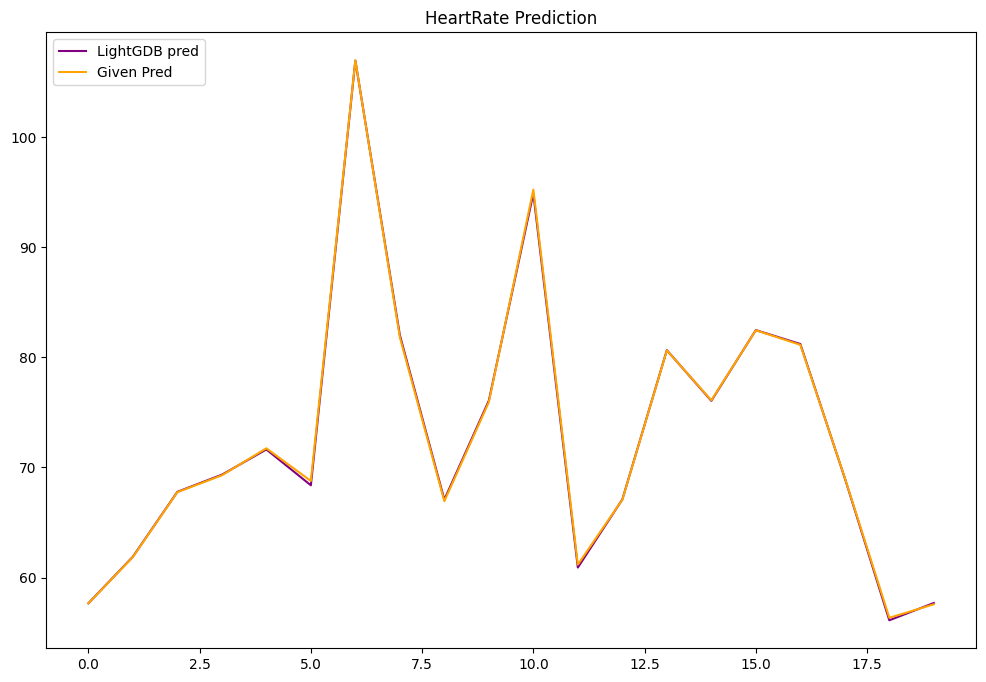

In [42]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_gdb[60:80], color = 'purple', label="LightGDB pred")
plt.plot(range(0,20), y_valid[60:80], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


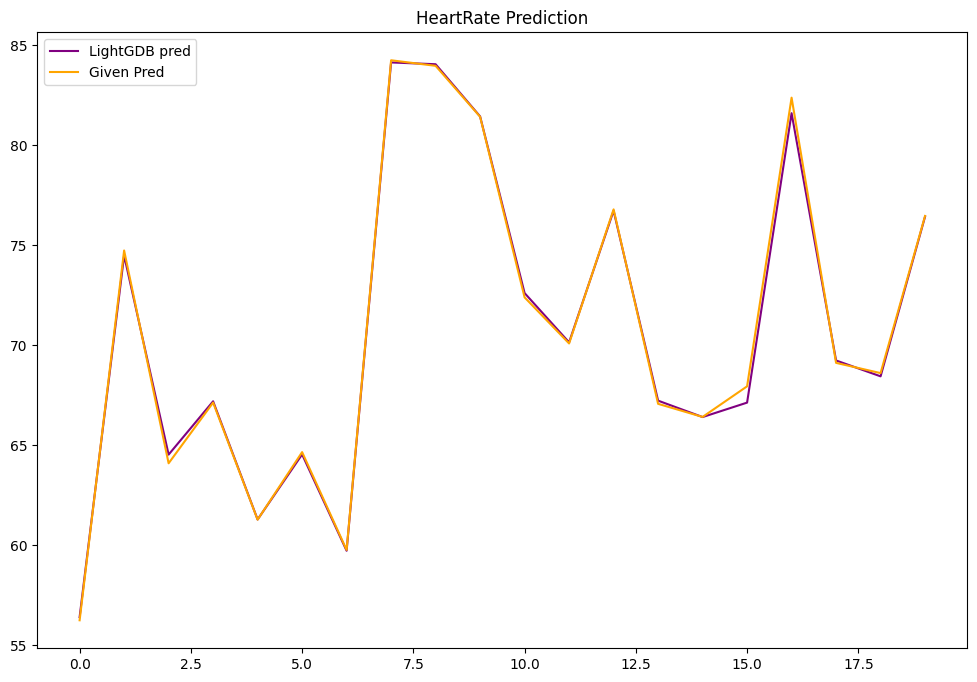

In [43]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_gdb[210:230], color = 'purple', label="LightGDB pred")
plt.plot(range(0,20), y_valid[210:230], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


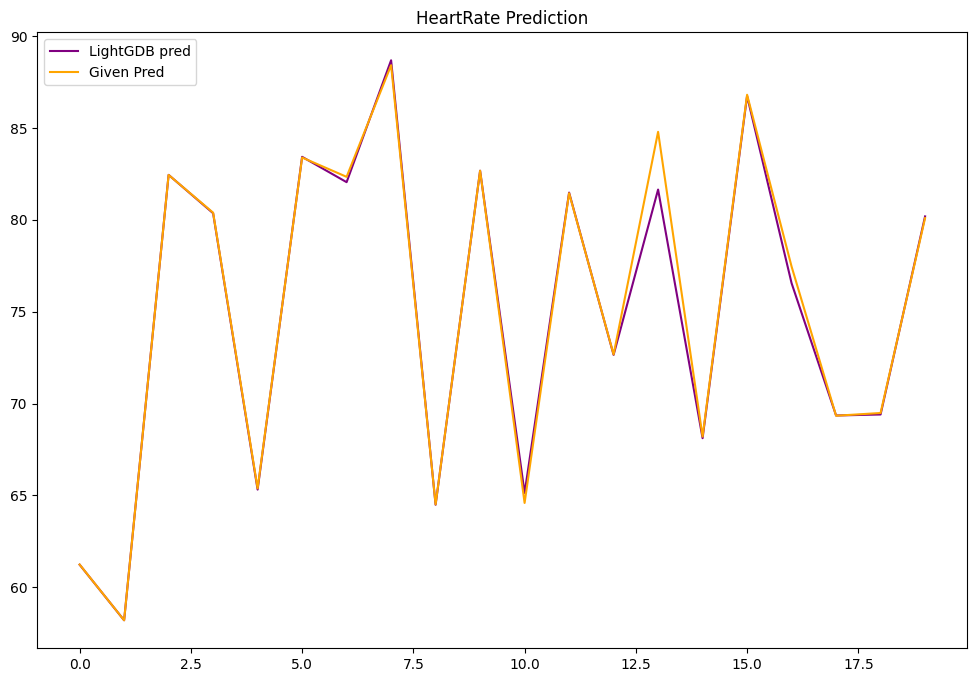

In [44]:
plt.figure(figsize=(12, 8))

plt.plot(range(0,20), pred_gdb[0:20], color = 'purple', label="LightGDB pred")
plt.plot(range(0,20), y_valid[0:20], color = 'orange', label="Given Pred")
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


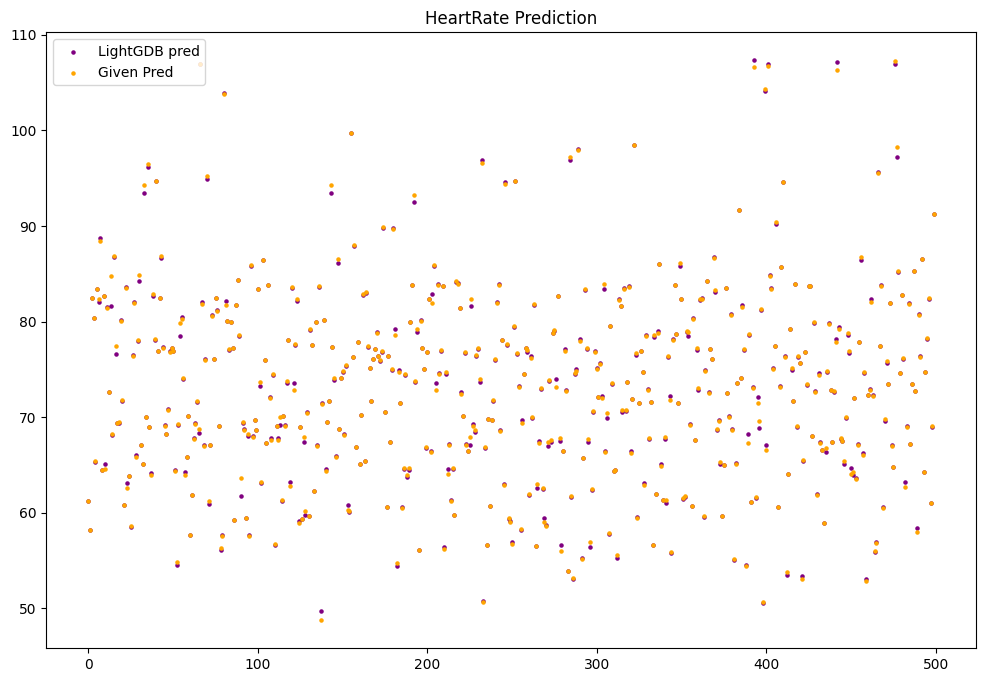

In [45]:
plt.figure(figsize=(12, 8))

plt.scatter(range(0,500), pred_gdb[:], color = 'purple', label="LightGDB pred", s = 5)
plt.scatter(range(0,500), y_valid[:], color = 'orange', label="Given Pred", s = 5)
plt.title("HeartRate Prediction")
plt.legend(loc="upper left")
plt.show()


In [47]:
#LightGBM model...

selected_features = ['MEAN_RR', 'MEDIAN_RR','SDRR_RMSSD_REL_RR', 'LF_NU', 'HF_NU', 'HF_PCT','HF_LF','RMSSD', 'SDSD','pNN25', 'pNN50','SDRR_REL_RR', 'SDSD_REL_RR','VLF','TP','KURT','SD2', 'LF']
X = data[selected_features] 

# Creating the feature matrix 'X' and target variable 'y'
X = data[selected_features]
y = data['HR'] 

# Splitting the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.1, random_state=42)

# Defining the LightGBM dataset for efficient handling
train_data = lgb.Dataset(X_train, label=y_train)
valid_data = lgb.Dataset(X_valid, label=y_valid, reference=train_data)

# LightGBM parameters (adjust as needed)
params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': 'mse',  # Mean Squared Error
    'max_depth': 16,
    'learning_rate': 0.08,
    'n_estimators': 1200,
    'verbose': 1
   
}

# Training the LightGBM model
lgb_model = lgb.train(params,
                      train_data,
                      num_boost_round=1000,  # Increase this or use early stopping
                      valid_sets=[train_data, valid_data],
                     # early_stopping_rounds=50,  # Optional: Early Stopping
                      #verbose_eval=10  # Display progress every 10 rounds
                     )

# Making predictions on the validation set
pred_gdb = lgb_model.predict(X_valid)

# Evaluating the model
mse = mean_squared_error(y_valid, pred_gdb)
r2 = r2_score(y_valid, pred_gdb)

print(f"Mean Squared Error (MSE): {mse}")
print(f"R-squared (R2) Score: {r2}")

/home/sanju/.local/lib/python3.10/site-packages/lightgbm/engine.py:172: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4403
[LightGBM] [Info] Number of data points in the train set: 4500, number of used features: 18
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Start training from score 74.091822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with

In [21]:
# XGB AND LIGHTGDB

xgb_gdb_pred = (pred_poly_xgb + pred_gdb) / 2  

# Evaluate ensemble performance
xgb_gdb_r2 = r2_score(y_valid, xgb_gdb_pred)
xgb_gdb_mse = mean_squared_error(y_valid, xgb_gdb_pred)

print("Ensemble R-squared (R2) Score:", xgb_gdb_r2)
print("Ensemble Mean Squared Error (MSE):", xgb_gdb_mse)

Ensemble R-squared (R2) Score: 0.9989275797251401
Ensemble Mean Squared Error (MSE): 0.11217681346603618


In [62]:
#ADA BOOST TRY OUT...

X, y = make_regression(n_samples=1000, n_features=10, noise=0.1, random_state=42)

X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.1, random_state=42)

# Adaboost...
base_estimator = DecisionTreeRegressor() 
ada_boost = AdaBoostRegressor(base_estimator=base_estimator, random_state=42)

# hyperparameters...
param_grid = {
    'n_estimators': [100, 125, 150], 
    'learning_rate': [ 0.1, 1.0, 1.2, 1.5, 1.7, 2, 2.25, 2.5, 2.7, 3] , 
    'base_estimator__max_depth': [ 8, 10, 13, 15, 17, 20, 23, 25, 27, 30]
}


grid_search = GridSearchCV(ada_boost, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# best params...
best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_

# Predict ...
ada_pred = best_estimator.predict(X_valid)

mse = mean_squared_error(y_valid, ada_pred)
r2 = r2_score(y_valid, ada_pred)

print("Best Parameters:", best_params)
print(f"Mean Squared Error (MSE): {mse}")
print(f"R-squared (R2) Score: {r2}")

/home/sanju/.local/lib/python3.10/site-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/home/sanju/.local/lib/python3.10/site-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/home/sanju/.local/lib/python3.10/site-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/home/sanju/.local/lib/python3.10/site-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/home/sanju/.local/lib/python3.10/site-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/home/sanj

Best Parameters: {'base_estimator__max_depth': 20, 'learning_rate': 2, 'n_estimators': 125}
Mean Squared Error (MSE): 2073.2503630052315
R-squared (R2) Score: 0.8834878998720537


In [67]:
#LightGBM model with num_leaves...

selected_features = ['MEAN_RR', 'MEDIAN_RR','SDRR_RMSSD_REL_RR', 'LF_NU', 'HF_NU', 'HF_PCT','HF_LF','RMSSD', 'SDSD','pNN25', 'pNN50','SDRR_REL_RR', 'SDSD_REL_RR','VLF','TP','KURT','SD2', 'LF']
X = data[selected_features] 

# Creating the feature matrix 'X' and target variable 'y'
X = data[selected_features]
y = data['HR'] 

# Splitting the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.1, random_state=42)

# Defining the LightGBM dataset for efficient handling
train_data = lgb.Dataset(X_train, label=y_train)
valid_data = lgb.Dataset(X_valid, label=y_valid, reference=train_data)

# LightGBM parameters (adjust as needed)
params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': 'mse',  # Mean Squared Error
    'max_depth': 16,
    'num_leaves': 18,
    'learning_rate': 0.08,
    'n_estimators': 1200,
    'verbose': 1
   
}

# Training the LightGBM model
lgb_model = lgb.train(params,
                      train_data,
                      num_boost_round=1000,  # Increase this or use early stopping
                      valid_sets=[train_data, valid_data],
                     # early_stopping_rounds=50,  # Optional: Early Stopping
                      #verbose_eval=10  # Display progress every 10 rounds
                     )

# Making predictions on the validation set
pred_gdb = lgb_model.predict(X_valid)

# Evaluating the model
mse = mean_squared_error(y_valid, pred_gdb)
r2 = r2_score(y_valid, pred_gdb)

print(f"Mean Squared Error (MSE): {mse}")
print(f"R-squared (R2) Score: {r2}")

/home/sanju/.local/lib/python3.10/site-packages/lightgbm/engine.py:172: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4403
[LightGBM] [Info] Number of data points in the train set: 4500, number of used features: 18
[LightGBM] [Info] Start training from score 74.091822
Mean Squared Error (MSE): 0.06813171786183257
R-squared (R2) Score: 0.9993486547412208
